# Implementace algoritmu DBSCAN

Cílem tohoto projektu je implementovat algoritmus DBSCAN (Density-Based Spatial Clustering of Applications with Noise) v jazyce Python a porovnat jeho výsledky s implementací z knihovny `scikit-learn`.

# Hlavní myšlenka algoritmu

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) je shlukovací algoritmus, který je založen na hustotě dat. Oproti jiným metodám, jako je K-means, DBSCAN nevyžaduje předem stanovený počet shluků a dokáže identifikovat shluky libovolného tvaru. Algoritmus pracuje na principu vyhledávání oblastí s vysokou hustotou datových bodů a odlišuje je od oblastí s nižší hustotou, které jsou interpretovány jako šum.

Hlavní předností DBSCANu je jeho schopnost odhalit odlehlé body (outliery) a přiřadit je jako šum, zatímco tradiční shlukovací algoritmy by mohly tyto body zahrnout do shluků. Důvod, proč jsem si tento algoritmus vybral, je jeho schopnost pracovat s daty, která obsahují šum a odlehlé body, což je častý problém v reálných datových sadách a takto může být algoritmus použit pro detekci anomálií, což ani jeden ostatní algoritmus nedokáže. Také mě zaujala jeho lehká citlivost na parametry a schopnost pracovat s daty libovolného tvaru.

# Princip algoritmu

DBSCAN identifikuje shluky na základě hustoty datových bodů v okolí. Každý bod je klasifikován jako:
- Core point (jádrový bod): Bod, který má ve svém okolí (dané parametrickým poloměrem ε) alespoň minimální počet bodů (MinPts).
- Border point (okrajový bod): Bod, který leží v okolí jádrového bodu, ale sám nemá dostatek sousedů k tomu, aby byl jádrovým bodem.
- Noise point (bod šumu): Bod, který nepatří do žádného shluku.

Algoritmus začíná s náhodně vybraným bodem. Pokud tento bod splňuje podmínky jádrového bodu, vytvoří se nový shluk. DBSCAN poté iterativně rozšiřuje shluk o všechny body, které jsou v dosahu ε a splňují podmínky MinPts. Proces pokračuje, dokud nejsou zpracovány všechny body v datové sadě.

Důležitými parametry algoritmu jsou poloměr `ε` a minimální počet bodů `MinPts`. Tyto parametry ovlivňují, jak citlivý bude algoritmus na detekci shluků a jaká bude jeho schopnost filtrovat šum.

# Implementace algoritmu

## Načtení knihoven

In [1]:
from enum import Enum
import time
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN as DBSCAN_sklearn

## Nastavení knihovny matplotlib

In [2]:
plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["font.size"] = 14
plt.rcParams["axes.titlesize"] = 16
plt.rcParams["axes.grid"] = False
plt.rcParams["xtick.bottom"] = False
plt.rcParams["xtick.labelbottom"] = False
plt.rcParams["ytick.left"] = False
plt.rcParams["ytick.labelleft"] = False

## Nastavení maximální hloubky rekurze pro prohledávání sousedů

In [3]:
sys.setrecursionlimit(10 ** 6)

## Nastavení náhodného generátoru

In [4]:
np.random.seed(42)

## Reprezentace bodu

Pro zjednodušení implementace algoritmu vytvoříme třídu `Point`, která bude reprezentovat jednotlivé body v prostoru. Každý bod bude mít následující atributy:
- **x**: souřadnice x
- **y**: souřadnice y
- **type**: Typ bodu
    - **CORE**: jádrový bod - bod, který má ve svém okolí alespoň MinPts bodů.
    - **BORDER**: okrajový bod - bod, který leží v okolí jádrového bodu, ale sám nemá dostatek sousedů.
    - **NOISE**: bod šumu - bod, který nepatří do žádného shluku.

In [5]:
class PointType(Enum):
    CORE = 0
    BORDER = 1
    NOISE = 2

- **cluster**: císlo shluku, do kterého bod patří
- **neighbors**: seznam sousedních bodů

In [6]:
class Point:
    def __init__(self, x, y):
        self.x = x
        self.y = y
        self.type = None
        self.cluster = None
        self.neighbors = []

## Výpočet vzdálenosti

Pro výpočet vzdálenosti mezi dvěma body použijeme **euklidovskou** vzdálenost.

In [7]:
def euclidean_distance(p1, p2):
    return ((p1.x - p2.x) ** 2 + (p1.y - p2.y) ** 2) ** 0.5

## Načtení dat

In [8]:
def load_data(file_name, delimiter=";"):
    points = []
    with open(file_name, "r") as :
        for line in file:
            x, y = map(float, line.strip().split(delimiter))
            points.append(Point(x, y))
    return points

## Reprezentace DBSCAN algoritmu

Nyní vytvoříme třídu `DBSCAN`, která bude obsahovat vše pro implementaci algoritmu a všechna potřebná nastavení.

Třída `DBSCAN` bude mít následující atributy:
- **epsilon**: poloměr ε - maximální vzdálenost mezi dvěma body
- **min_pts**: minimální počet bodů MinPts - minimální počet bodů v okolí, aby byl bod považován za jádrový
- **points**: seznam bodů v datové sadě - instance třídy `Point`

Metody třídy `DBSCAN`:
- **_get_neighbors**: získá všechny sousedy bodu
- **_mark_neighbors**: označí všechny sousedy bodu jako jádrové nebo okrajové body
- **run**: spustí algoritmus DBSCAN

In [9]:
class DBSCAN:
    def __init__(self, input_epsilon, input_min_points):
        self.epsilon = input_epsilon
        self.min_pts = input_min_points
        self.points = []

    # hlavní metody pro spuštění algoritmu

    def _get_neighbors(self, point):
        neighbors = []
        for p in self.points:  # pro všechny body v datové sadě chceme zjistit, zda jsou sousedé
            # pokud nesledujeme bod samotný a vzdálenost mezi body je menší než epsilon, pak bod je sousedem
            if p != point and euclidean_distance(point, p) <= self.epsilon:  # na základě vzdálenosti
                neighbors.append(p)
        return neighbors

    def _mark_neighbors(self, point, neighbors):
        for neighbor in neighbors:  # pro všechny sousedy
            if neighbor.cluster is None:  # díváme se pouze na body, které ještě nemají přiřazený shluk
                neighbor.cluster = point.cluster  # přiřadíme mu stejný shluk jako má bod
                neighbor.neighbors = self._get_neighbors(neighbor)  # zjistíme sousedy jeho souseda
                if len(neighbor.neighbors) >= self.min_pts:  # pokud má dostatek sousedů, je to jádrový bod
                    self._mark_neighbors(neighbor, neighbor.neighbors)  # rekurzivně označíme jeho sousedy
                else:
                    # pokud nemá dostatek sousedů, je to okrajový bod
                    neighbor.type = PointType.BORDER

    def run(self, input_data):
        # vytvoříme instance třídy Point pro každý bod v datové sadě pro lepší práci s nimi
        self.points = [Point(x, y) for x, y in input_data]
        cluster_id = 0  # inicializujeme číslo shluku
        for point in self.points:  # pro všechny body v datové sadě
            if point.cluster is not None:  # pokud už má bod přiřazený shluk, pokračujeme
                continue
            point.neighbors = self._get_neighbors(point)  # zjistíme sousedy bodu
            if len(point.neighbors) < self.min_pts:  # pokud nemá dostatek sousedů, je to bod šumu
                point.type = PointType.NOISE  # označíme ho jako bod šumu
                point.cluster = -1  # a přiřadíme mu speciální hodnotu -1, stejně jako v knihovně sklearn
            else:
                point.cluster = cluster_id  # jinak je to jádrový bod a přiřadíme mu nový shluk
                point.type = PointType.CORE  # označíme ho jako jádrový bod
                self._mark_neighbors(point, point.neighbors)  # označíme všechny jeho sousedy
                cluster_id += 1  # zvýšíme číslo shluku pro další jádrový bod

    # od tohoto bodu jsou zde jen pomocné metody pro získání informací o výsledcích algoritmu

    def print_cluster_sizes(self):
        clusters = {point.cluster for point in self.points if point.cluster is not None}
        for clust in clusters:
            cluster_size = sum(1 for point in self.points if point.cluster == clust)
            print(f"Shluk {clust}: {cluster_size} bodů")

    def get_labels(self):
        return [point.cluster for point in self.points]

    def plot(self):
        colors = [point.cluster for point in self.points]
        plt.scatter([point.x for point in self.points], [point.y for point in self.points], c=colors)
        plt.title("DBSCAN Shlukování")
        plt.show()

# Testování algoritmu

Nyní můžeme otestovat implementaci algoritmu DBSCAN na datech a porovnat výsledky s implementací z knihovny `scikit-learn`. Ale ještě než to uděláme, musíme vytvořit několik pomocných funkcí pro vizualizaci výsledků.

## Příprava dat a pomocných funkcí

### Časová doba běhu algoritmu

Pro měření časové doby běhu algoritmu vytvoříme třídu `TimeTracker`, která nám umožní měřit časovou dobu běhu kódu pomocí kontextového manažeru `with`.

In [10]:
class TimeTracker:
    def __enter__(self):
        self.start_time = time.time()
        return self

    def __exit__(self, exc_type, exc_value, traceback):
        self.end_time = time.time()
        self.execution_time = self.end_time - self.start_time
        print(f"Celkový čas: {self.execution_time:.4f} sekund")

### Porovnání pomocí vizualizace

In [11]:
def compare_plots(input_data, labels1, labels2):
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].scatter(input_data[:, 0], input_data[:, 1], c=labels1)
    axs[0].set_title("DBSCAN shlukování (vlastní implementace)")
    axs[1].scatter(input_data[:, 0], input_data[:, 1], c=labels2)
    axs[1].set_title("DBSCAN shlukování (sklearn)")
    plt.show()

### Načtení dat

In [12]:
DATASET_PATH = "../datasets/data_clustering"


def get_all_csv_paths():
    all_paths = []
    for root, dirs, files in os.walk(DATASET_PATH):
        for file in files:
            if file.endswith(".csv") and file != "winequality-red.csv":
                all_paths.append(os.path.join(root, file))
    # Fix for Windows paths
    all_paths = [path.replace("\\", "/") for path in all_paths]
    return all_paths

In [13]:
all_cvs_paths = get_all_csv_paths()
all_cvs_paths

['../datasets/data_clustering/annulus.csv',
 '../datasets/data_clustering/boxes.csv',
 '../datasets/data_clustering/clusters3.csv',
 '../datasets/data_clustering/clusters5.csv',
 '../datasets/data_clustering/clusters5n.csv',
 '../datasets/data_clustering/densegrid.csv']

In [14]:
chosen_dataset = all_cvs_paths[4]
chosen_dataset

'../datasets/data_clustering/clusters5n.csv'

### Zpracování dat

In [15]:
data = np.loadtxt(chosen_dataset, delimiter=';')

## Spuštění algoritmu

#### Nastavení parametrů algoritmu

Nyní můžeme nastavit parametry algoritmu DBSCAN, tj. poloměr ε a minimální počet bodů MinPts. Jelikož jsou tyto parametry vcelku citlivé na konkrétní data, je vhodné s nimi experimentovat a hledat optimální hodnoty.

Nejprve zvolíme hodnoty, které jsem si vybral pro testování algoritmu. Ty spustíme pro všechny datové sady a porovnáme výsledky s implementací z knihovny `scikit-learn`.

Následně můžeme experimentovat s různými hodnotami parametrů a sledovat, jak se mění výsledky algoritmu, pouze na jednom, pěkném datasetu.

In [16]:
epsilon = 2
min_pts = 5

### Vlastní implementace

In [17]:
my_dbscan = DBSCAN(input_epsilon=epsilon, input_min_points=min_pts)
with TimeTracker():
    my_dbscan.run(data)

Celkový čas: 0.7270 sekund


##### Vizualizace výsledků

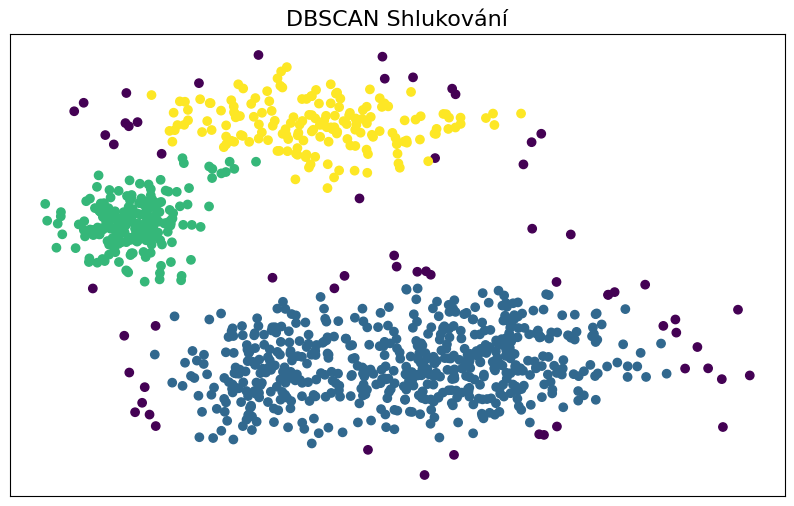

In [18]:
my_dbscan.plot()

### Implementace z knihovny `scikit-learn`

In [19]:
dbscan_sklearn = DBSCAN_sklearn(eps=epsilon, min_samples=min_pts)
with TimeTracker():
    dbscan_sklearn.fit(data)

Celkový čas: 0.0071 sekund


##### Vizualizace výsledků

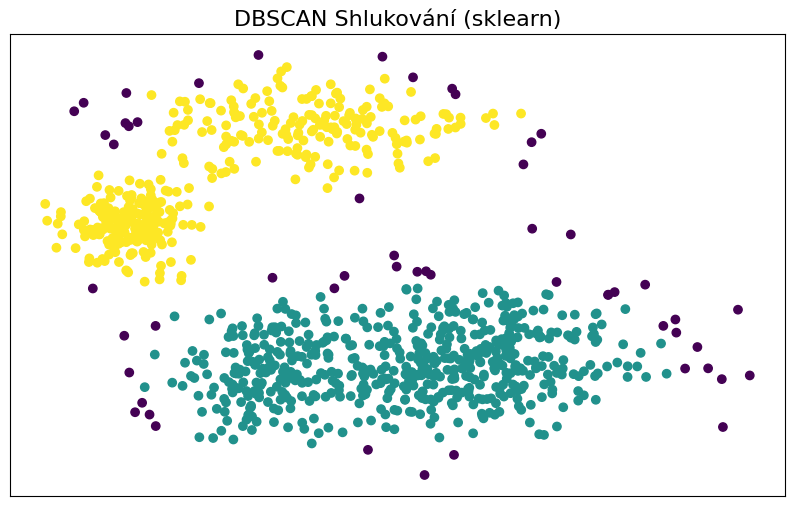

In [20]:
plt.scatter(data[:, 0], data[:, 1], c=dbscan_sklearn.labels_)
plt.title("DBSCAN Shlukování (sklearn)")
plt.show()

### Porovnání výsledků

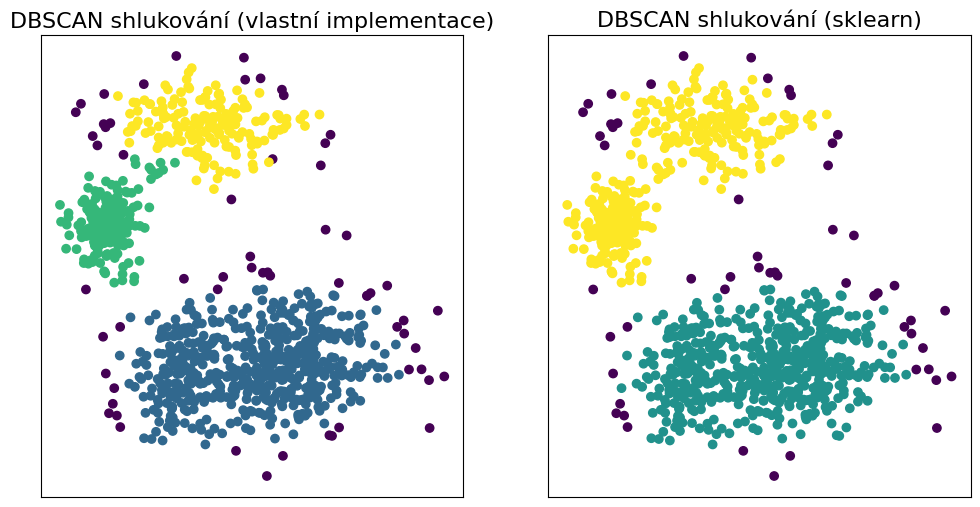

In [21]:
compare_plots(data, my_dbscan.get_labels(), dbscan_sklearn.labels_)

Vypadá to dobře. Až na drobné krajní vyjímky shluky vypadají dost podobně. Pro tyto dolehlé body si knihovna `scikit-learn` vytvořila speciální pravidla, do kterých v rámci tohoto projektu nebudeme zasahovat. Nyní můžeme zkusit další datasety a parametry algoritmu.

## Spuštění algoritmu na všech datasetech a porovnání výsledků

Dataset: annulus.csv

Celkový čas: 0.6071 sekund
Celkový čas: 0.0067 sekund


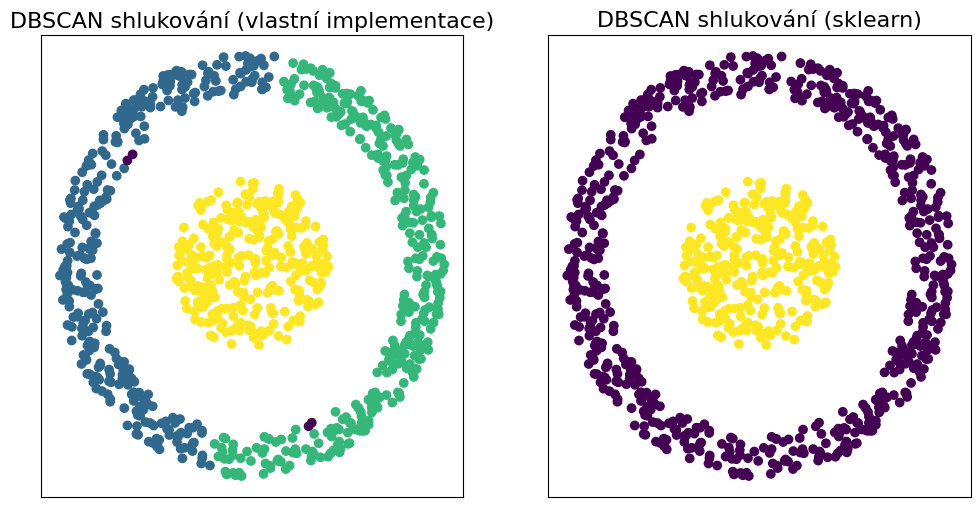

Dataset: boxes.csv

Celkový čas: 3.7309 sekund
Celkový čas: 0.0120 sekund


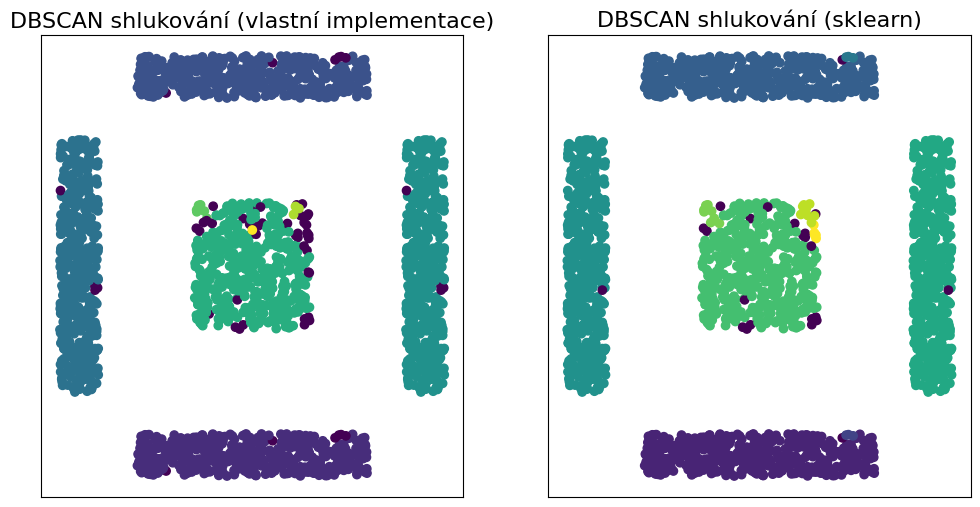

Dataset: clusters3.csv

Celkový čas: 0.0549 sekund
Celkový čas: 0.0050 sekund


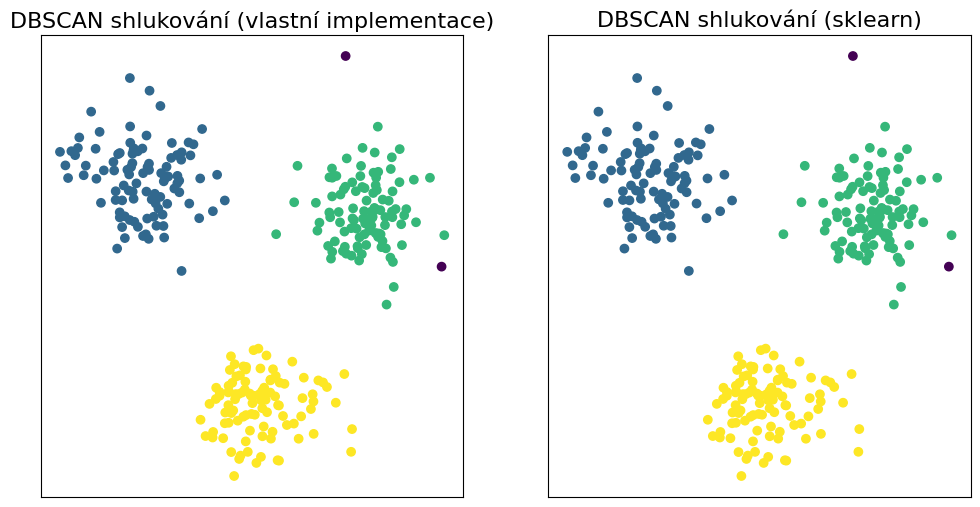

Dataset: clusters5.csv

Celkový čas: 0.5698 sekund
Celkový čas: 0.0106 sekund


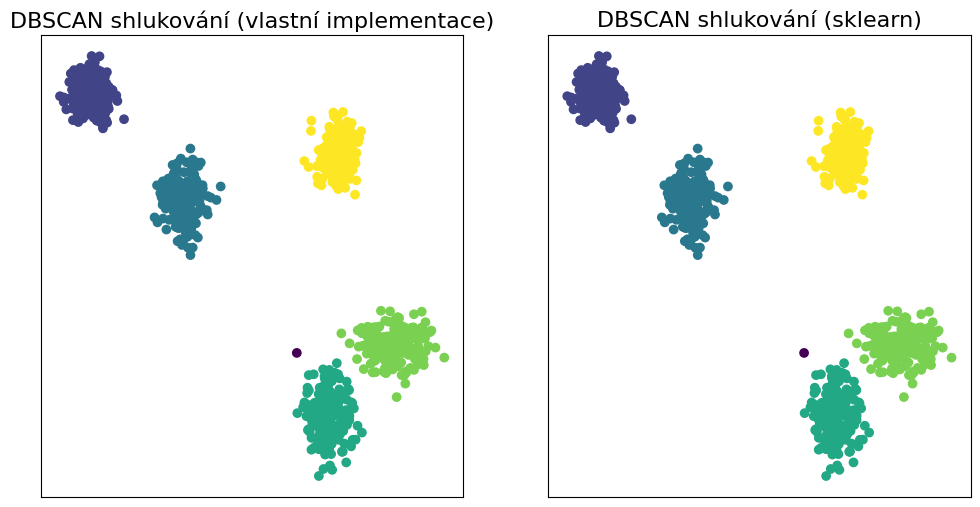

Dataset: clusters5n.csv

Celkový čas: 0.5746 sekund
Celkový čas: 0.0046 sekund


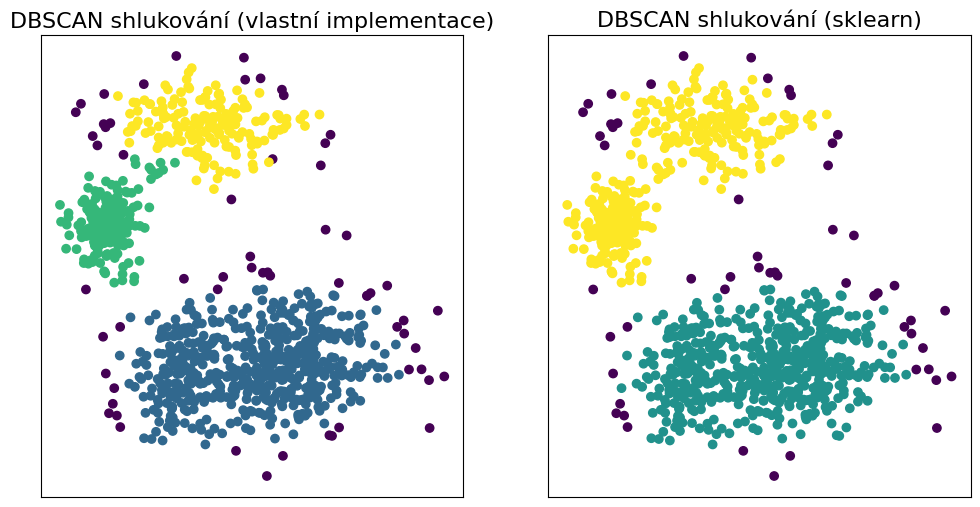

Dataset: densegrid.csv

Celkový čas: 9.7623 sekund
Celkový čas: 0.1092 sekund


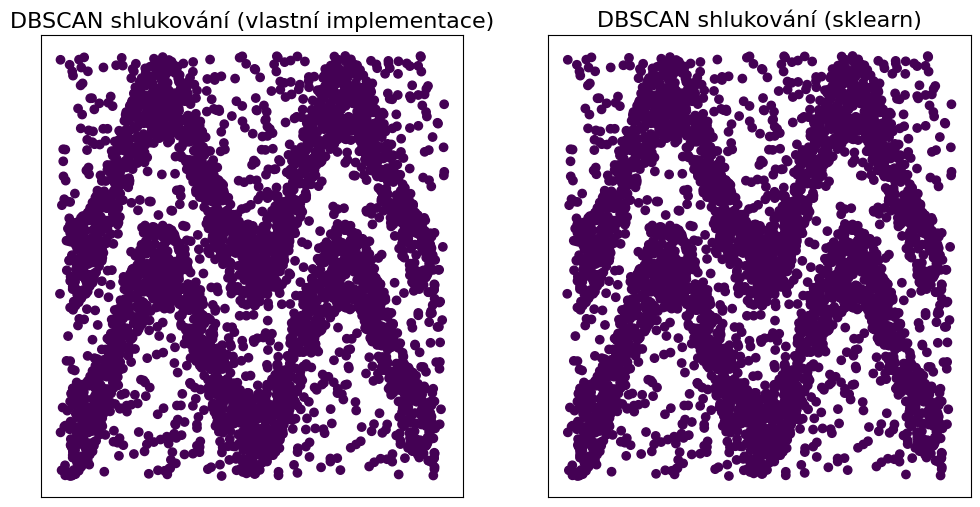

In [22]:
for csv_file in all_cvs_paths:
    print(f"Dataset: {csv_file.split('/')[-1]}\n")
    data = np.loadtxt(csv_file, delimiter=';')
    my_dbscan = DBSCAN(input_epsilon=epsilon, input_min_points=min_pts)
    with TimeTracker():
        my_dbscan.run(data)
    dbscan_sklearn = DBSCAN_sklearn(eps=epsilon, min_samples=min_pts)
    with TimeTracker():
        dbscan_sklearn.fit(data)
    unique, counts = np.unique(dbscan_sklearn.labels_, return_counts=True)
    dict(zip(unique, counts))
    compare_plots(data, my_dbscan.get_labels(), dbscan_sklearn.labels_)

Kromě datasetu `annulus.csv` vypadají výsledky velmi podobně. Výsledky pro dataset `annulus.csv` se liší, a upřímně řečeno, nevím proč. Může to být způsobeno tím, že tento dataset má tvar prstence a algoritmus nemusí být schopen správně identifikovat shluky. Moje implementace algoritmu souhlasí více s teorií, kde by měl být tento dataset rozdělen na dva shluky. Taky to může být způsobeno prvním náhodně vybraným bodem, který může ovlivnit výsledky algoritmu. Nicméně, výsledky pro všechny ostatní datasety jsou velmi podobné.

## Spuštění algoritmu na jednom datasetu s různými parametry

Nyní můžeme experimentovat s různými hodnotami parametrů algoritmu a sledovat, jak se mění výsledky. Zvolíme jeden dataset a spustíme algoritmus s různými hodnotami poloměru ε a minimálního počtu bodů MinPts.

- Pro hodnoty parametrů `epsilon` se budeme pohybovat v rozmezí od 0.1 do 3.1 s krokem 0.5.
- Pro hodnoty parametrů `min_pts` se budeme pohybovat v rozmezí od 5 do 11 s krokem 2.
- Jako dataset zvolíme již použitý dataset `clusters5n`, jelikož všechny ostatní datasety jsou perfektně rozděleny a dataset `densegrid`, jelikož je velmi hustý a obsahuje hodně bodů, což může být zajímavé pro experimentování s parametry.

In [23]:
epsilon_range = np.arange(0.1, 3.2, 0.5)
min_pts_range = np.arange(5, 12, 2)

### Dataset `clusters5n`

In [24]:
chosen_datasets = all_cvs_paths[4]

epsilon: 0.1, min_pts: 5

Celkový čas: 0.5201 sekund
Celkový čas: 0.0099 sekund


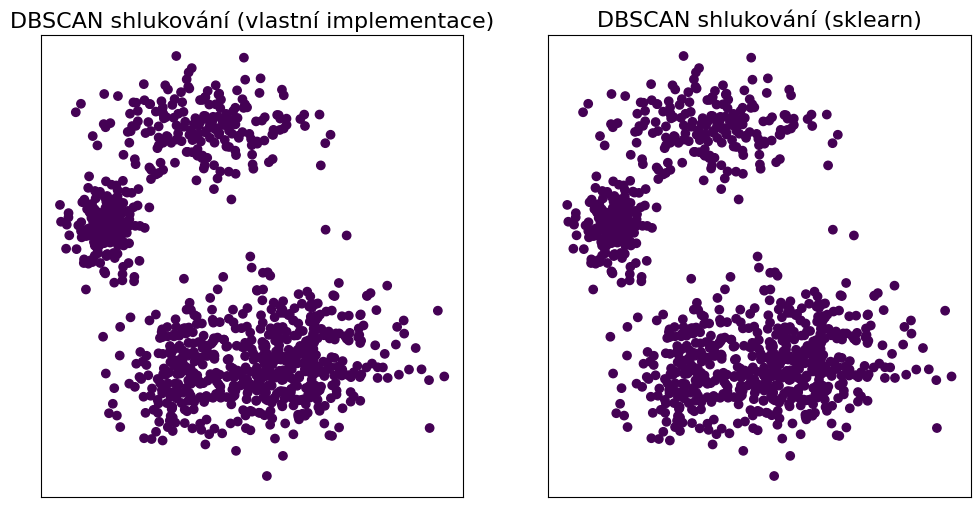

epsilon: 0.1, min_pts: 7

Celkový čas: 0.5298 sekund
Celkový čas: 0.0000 sekund


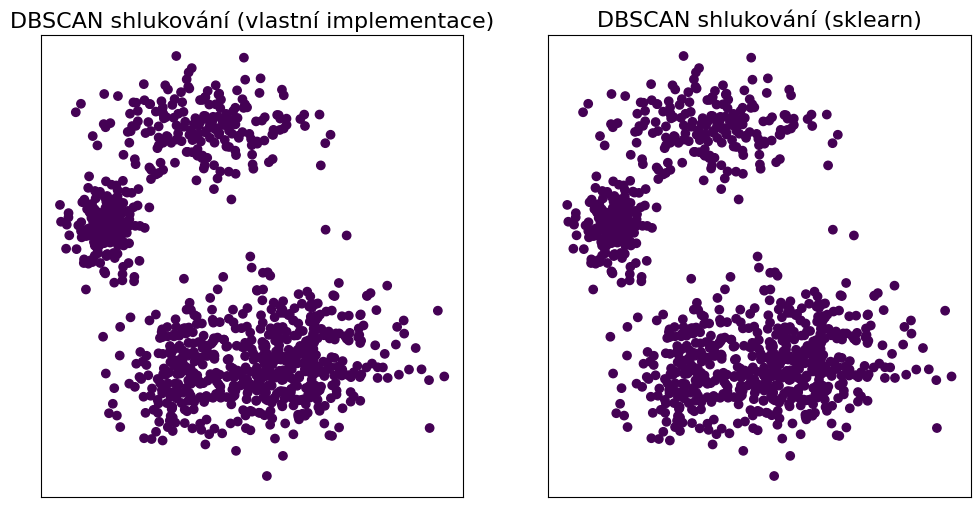

epsilon: 0.1, min_pts: 9

Celkový čas: 0.5321 sekund
Celkový čas: 0.0051 sekund


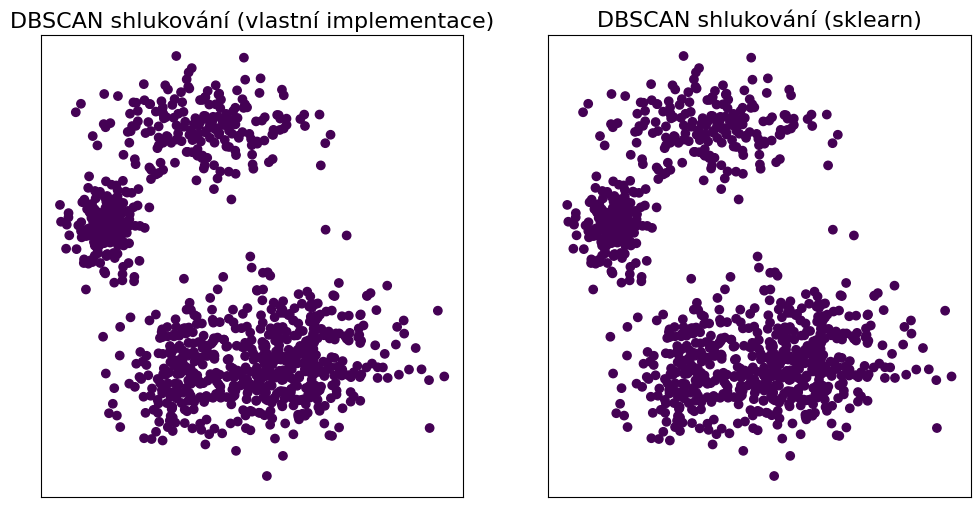

epsilon: 0.1, min_pts: 11

Celkový čas: 0.5524 sekund
Celkový čas: 0.0000 sekund


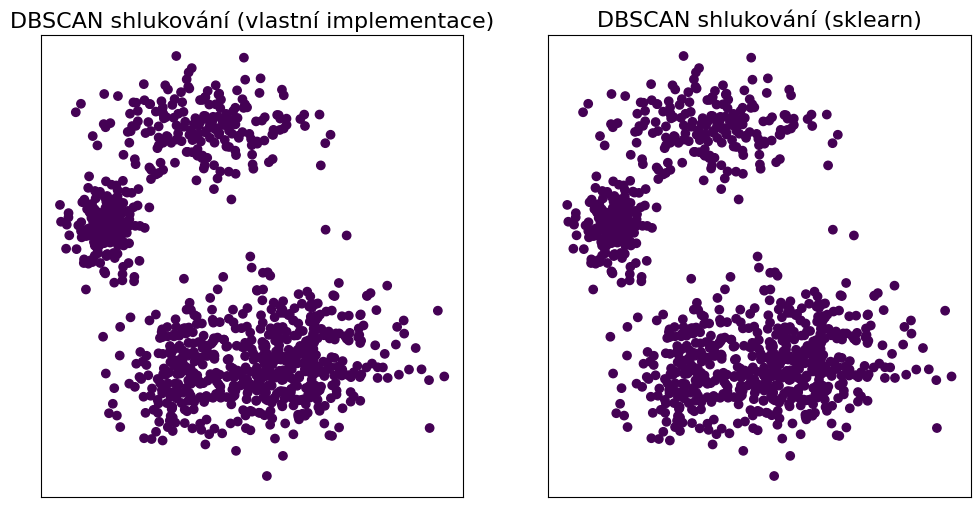

epsilon: 0.6, min_pts: 5

Celkový čas: 0.5706 sekund
Celkový čas: 0.0045 sekund


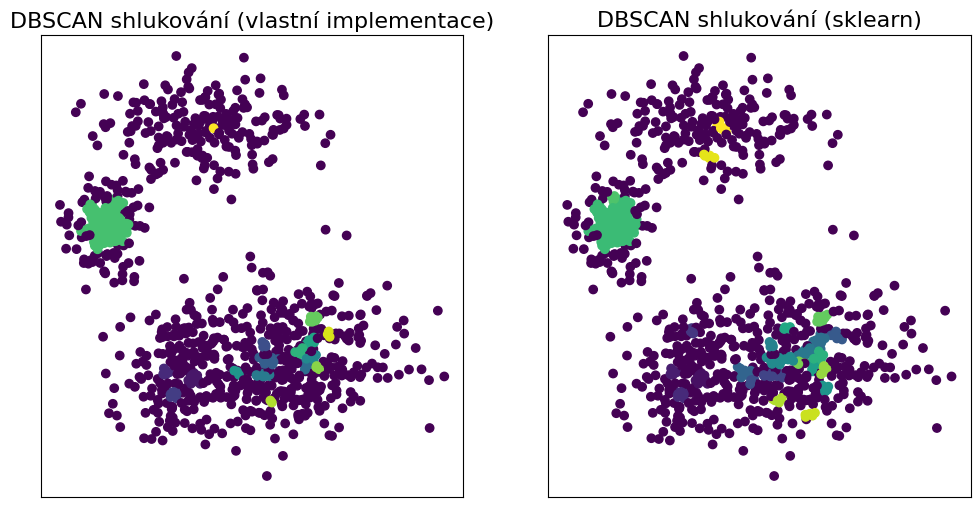

epsilon: 0.6, min_pts: 7

Celkový čas: 0.5479 sekund
Celkový čas: 0.0000 sekund


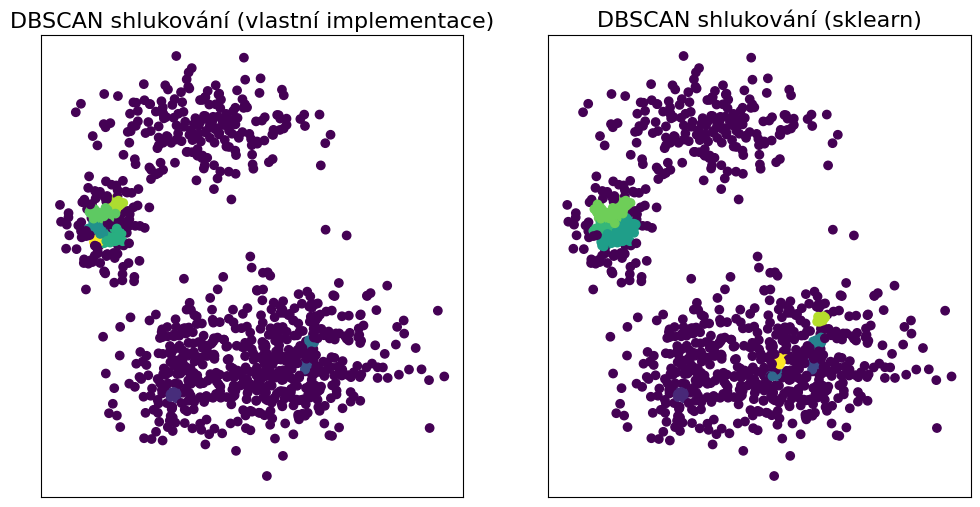

epsilon: 0.6, min_pts: 9

Celkový čas: 0.6187 sekund
Celkový čas: 0.0000 sekund


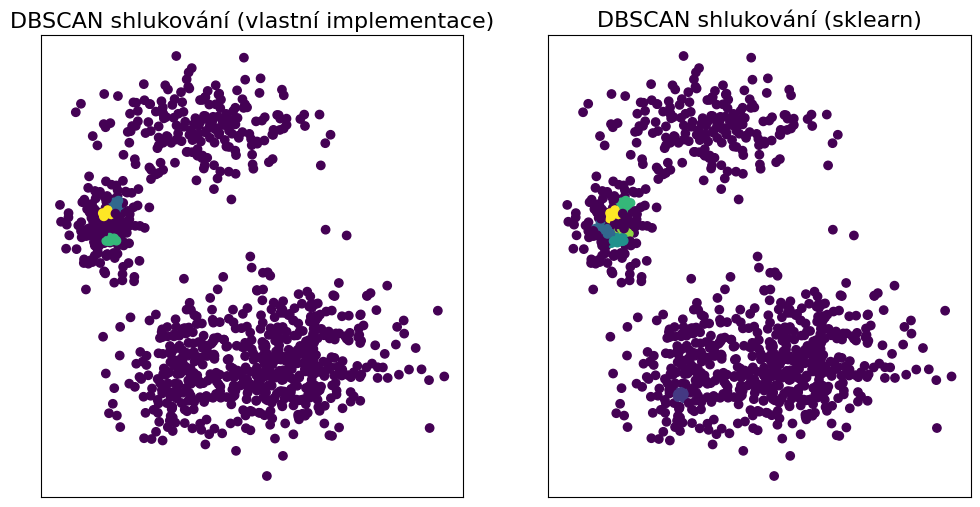

epsilon: 0.6, min_pts: 11

Celkový čas: 0.5814 sekund
Celkový čas: 0.0010 sekund


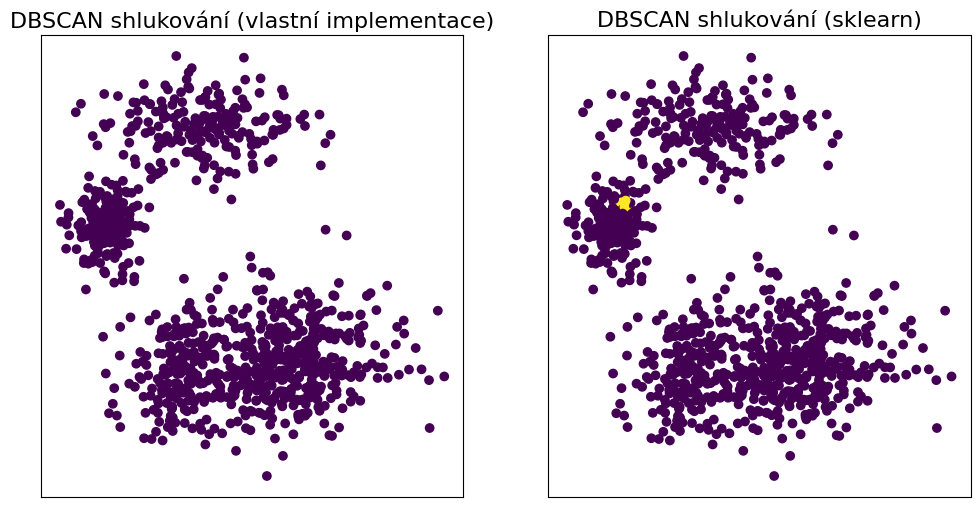

epsilon: 1.1, min_pts: 5

Celkový čas: 0.5797 sekund
Celkový čas: 0.0010 sekund


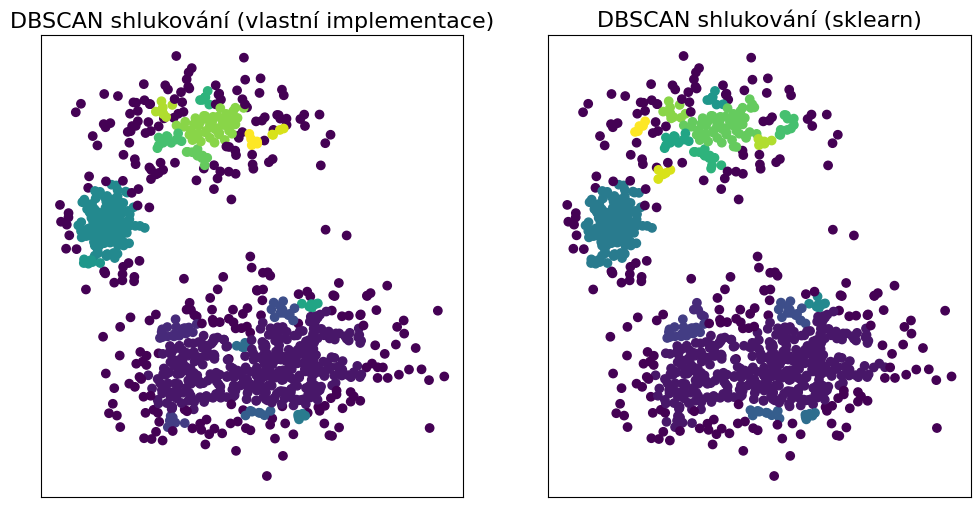

epsilon: 1.1, min_pts: 7

Celkový čas: 0.5870 sekund
Celkový čas: 0.0000 sekund


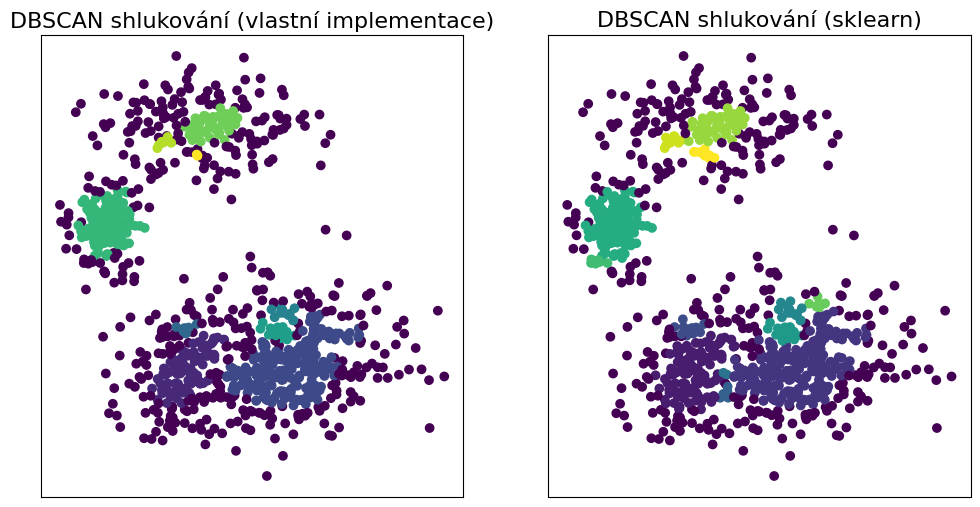

epsilon: 1.1, min_pts: 9

Celkový čas: 0.5393 sekund
Celkový čas: 0.0000 sekund


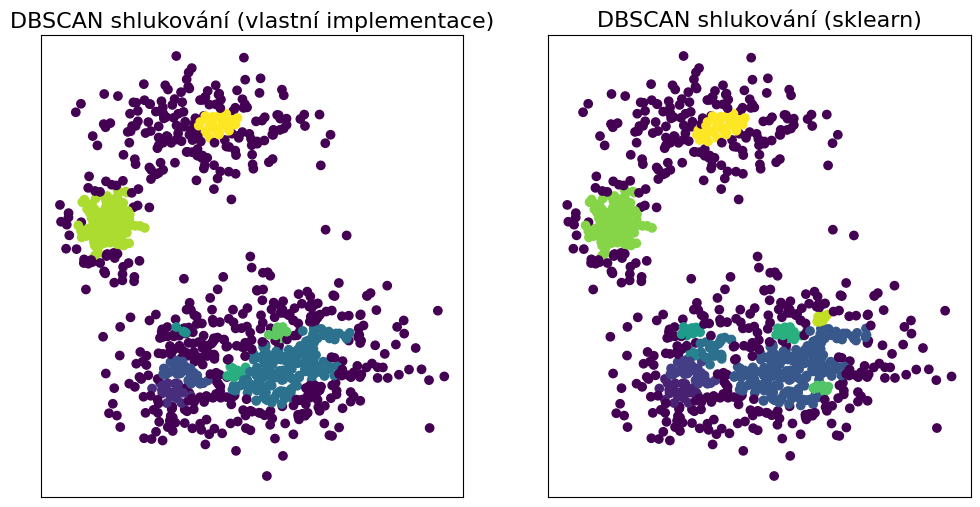

epsilon: 1.1, min_pts: 11

Celkový čas: 0.5692 sekund
Celkový čas: 0.0000 sekund


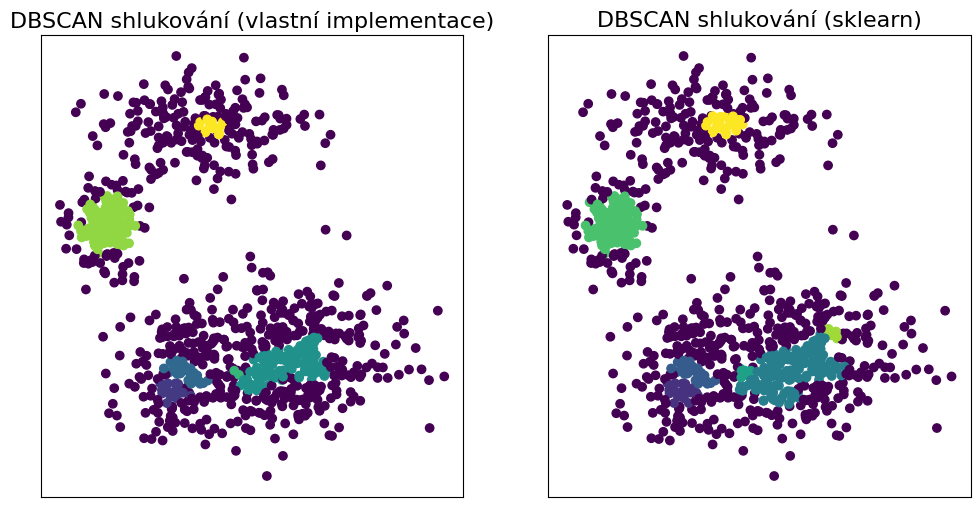

epsilon: 1.6, min_pts: 5

Celkový čas: 0.5592 sekund
Celkový čas: 0.0000 sekund


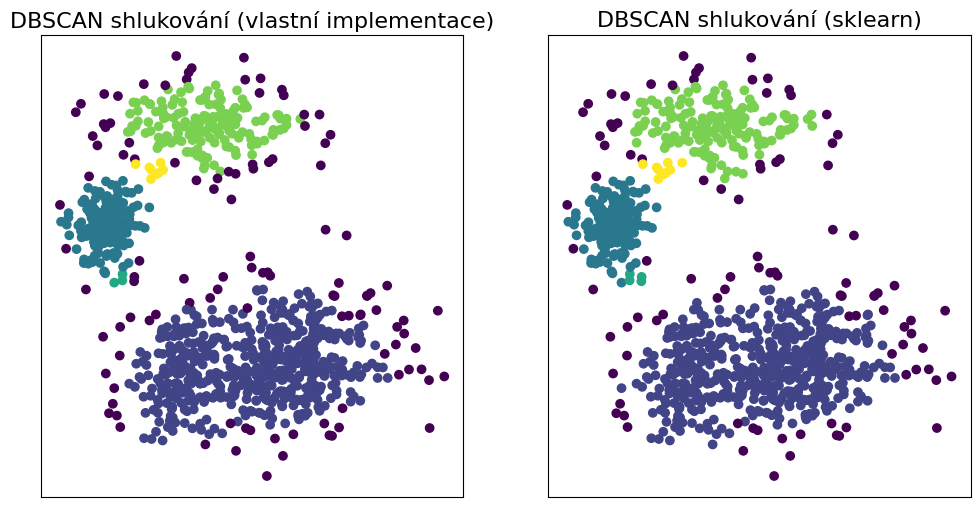

epsilon: 1.6, min_pts: 7

Celkový čas: 0.5538 sekund
Celkový čas: 0.0156 sekund


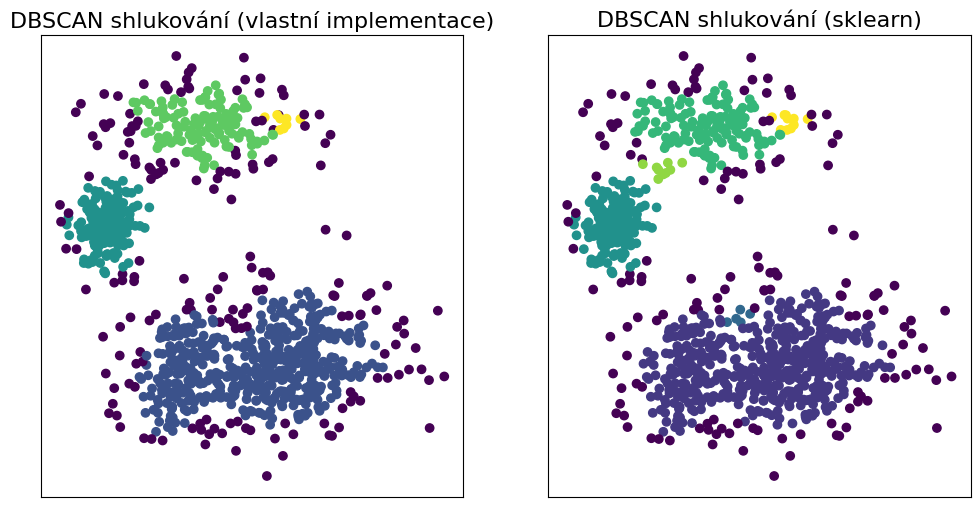

epsilon: 1.6, min_pts: 9

Celkový čas: 0.5834 sekund
Celkový čas: 0.0045 sekund


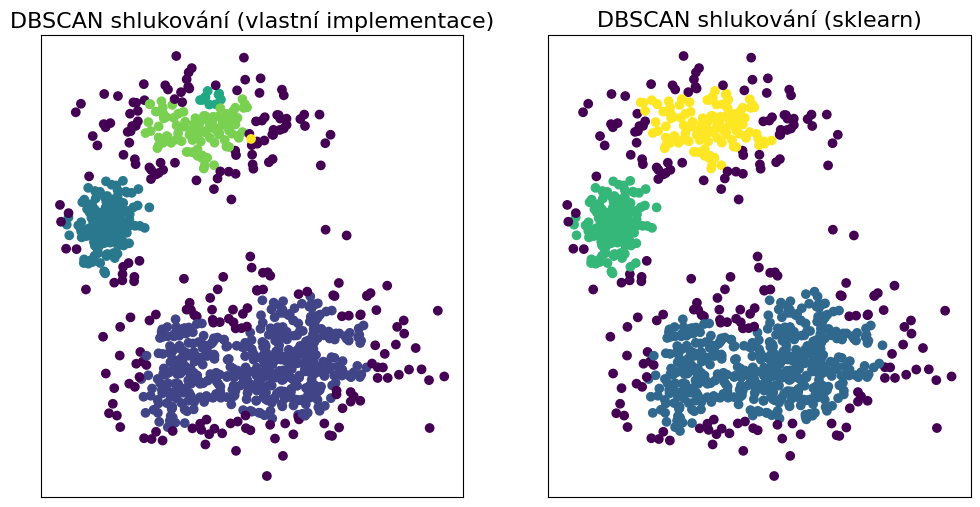

epsilon: 1.6, min_pts: 11

Celkový čas: 0.5623 sekund
Celkový čas: 0.0057 sekund


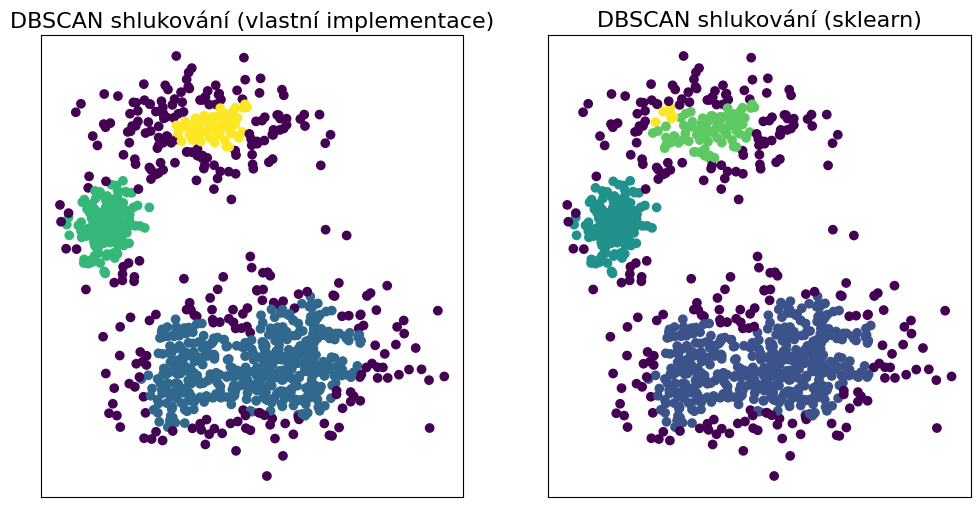

epsilon: 2.1, min_pts: 5

Celkový čas: 0.5699 sekund
Celkový čas: 0.0116 sekund


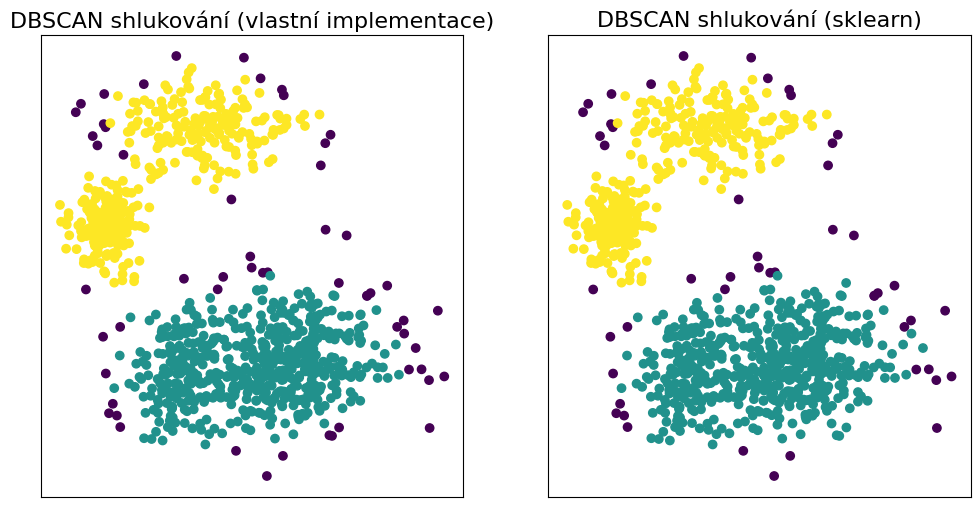

epsilon: 2.1, min_pts: 7

Celkový čas: 0.5597 sekund
Celkový čas: 0.0100 sekund


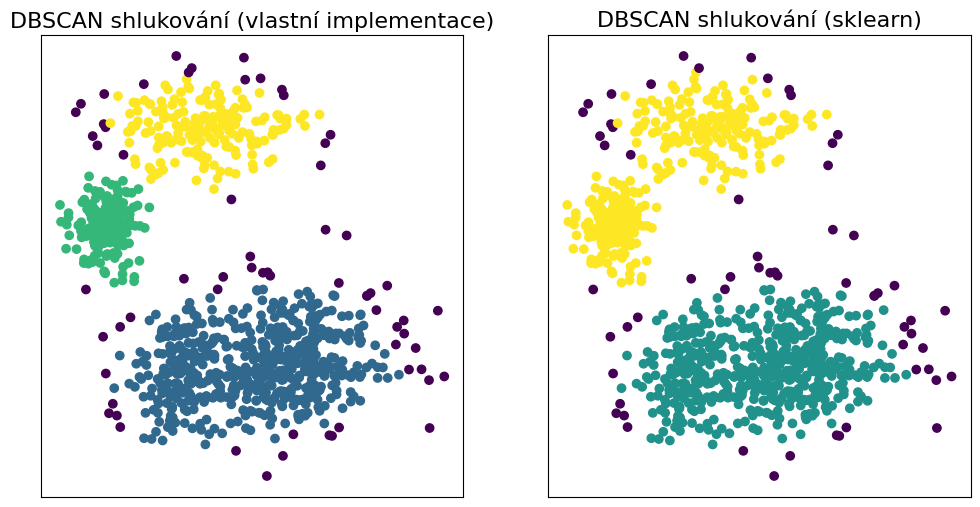

epsilon: 2.1, min_pts: 9

Celkový čas: 0.5805 sekund
Celkový čas: 0.0060 sekund


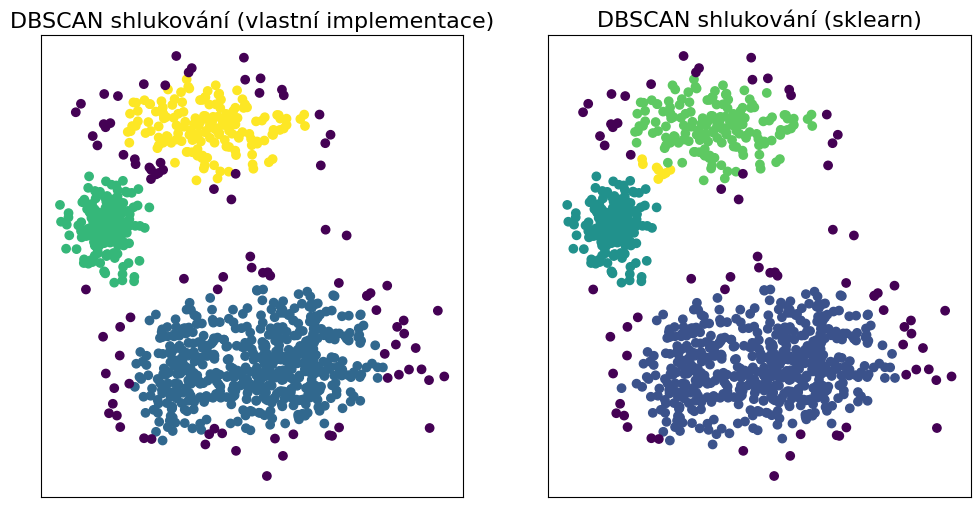

epsilon: 2.1, min_pts: 11

Celkový čas: 0.6563 sekund
Celkový čas: 0.0053 sekund


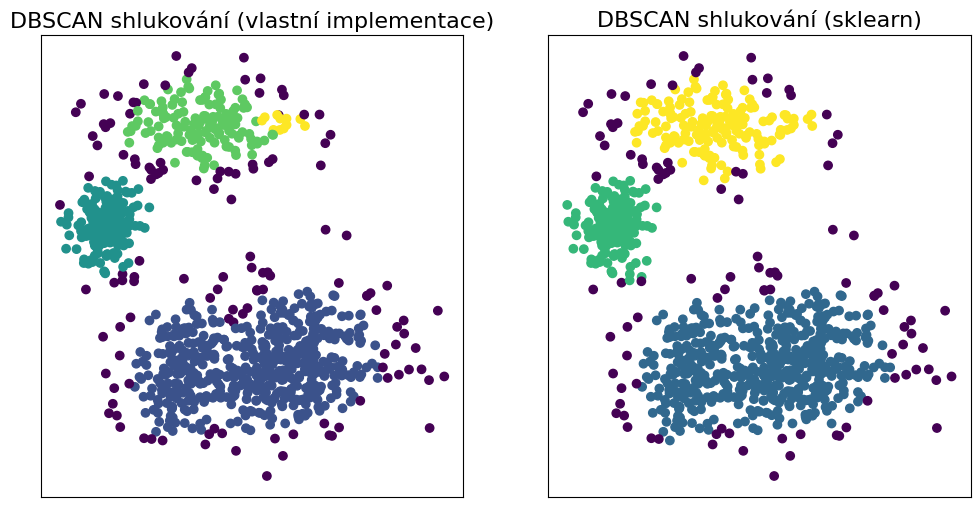

epsilon: 2.6, min_pts: 5

Celkový čas: 0.5946 sekund
Celkový čas: 0.0000 sekund


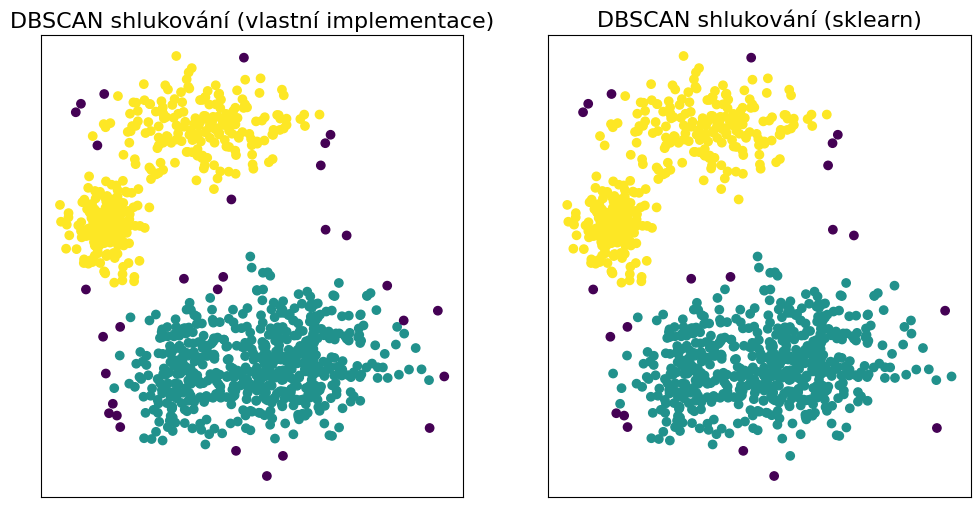

epsilon: 2.6, min_pts: 7

Celkový čas: 0.5861 sekund
Celkový čas: 0.0000 sekund


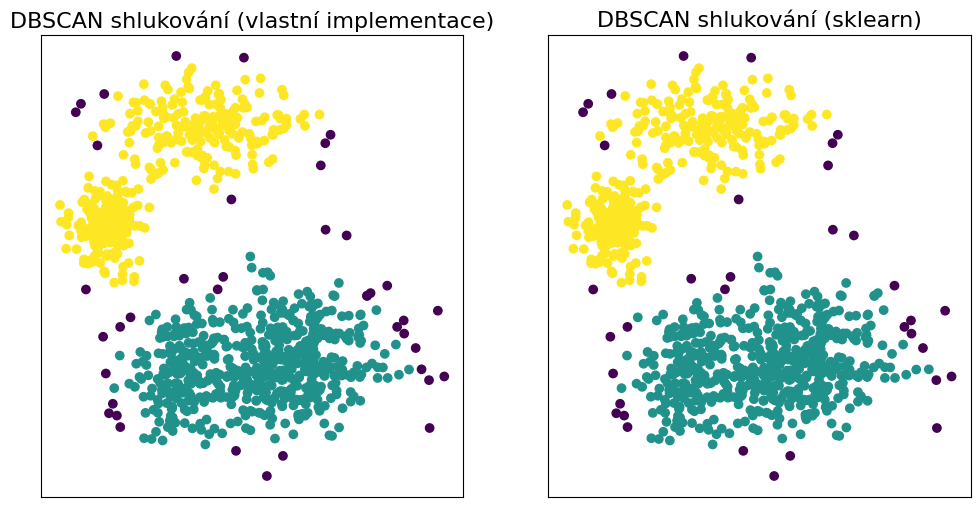

epsilon: 2.6, min_pts: 9

Celkový čas: 0.5811 sekund
Celkový čas: 0.0000 sekund


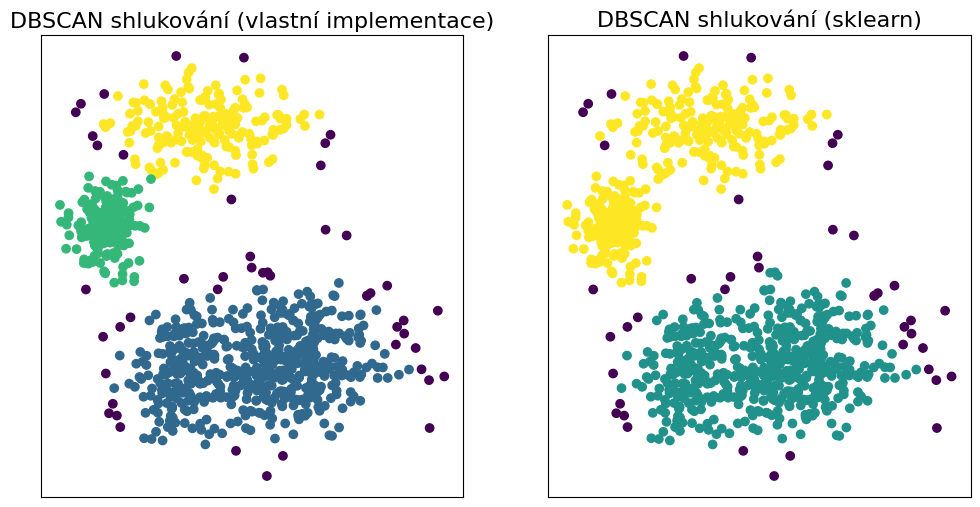

epsilon: 2.6, min_pts: 11

Celkový čas: 0.5690 sekund
Celkový čas: 0.0055 sekund


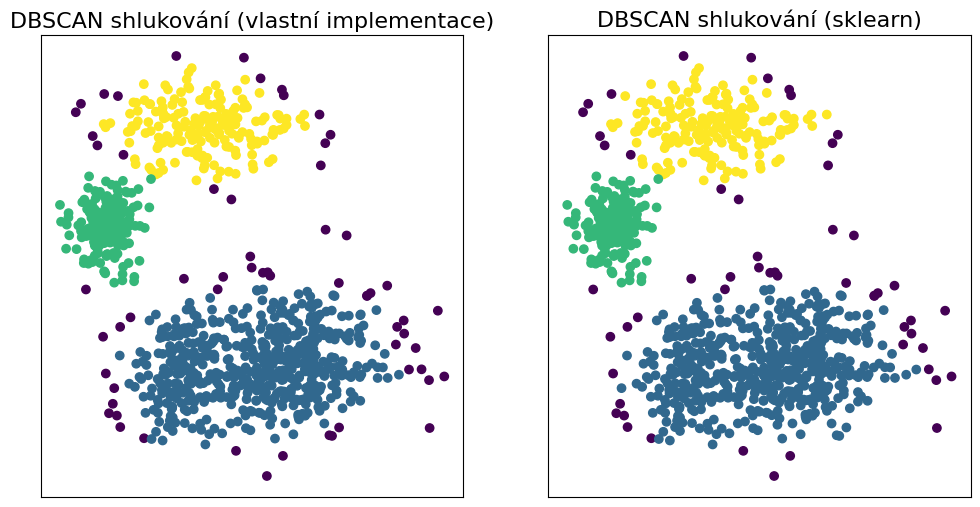

epsilon: 3.1, min_pts: 5

Celkový čas: 0.5599 sekund
Celkový čas: 0.0101 sekund


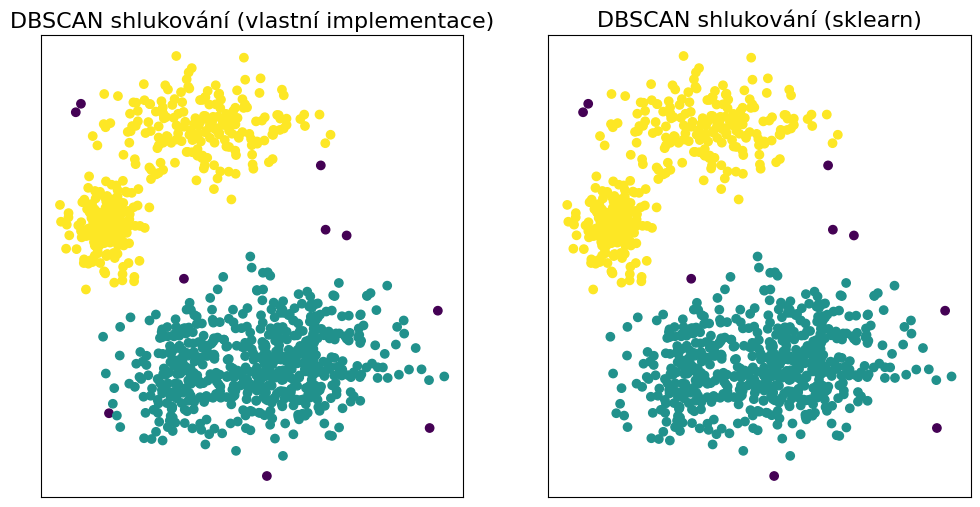

epsilon: 3.1, min_pts: 7

Celkový čas: 0.5777 sekund
Celkový čas: 0.0043 sekund


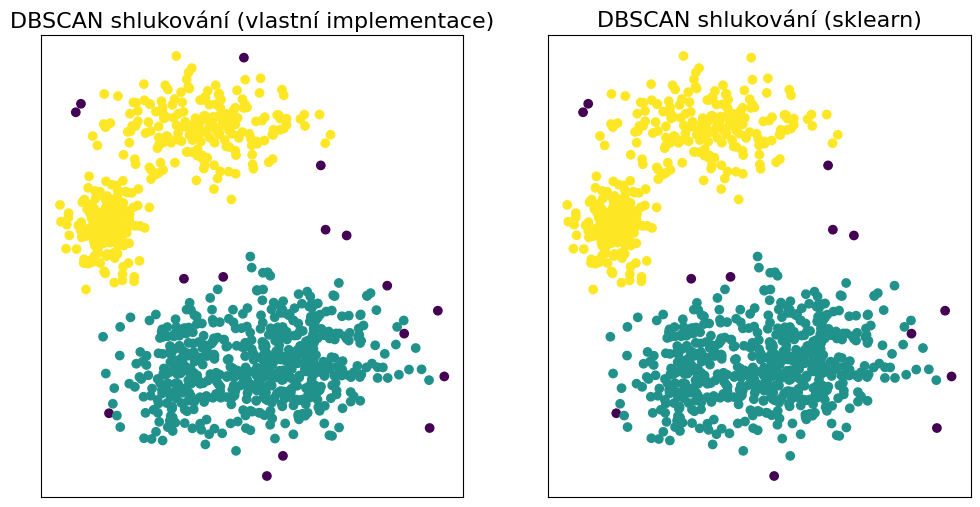

epsilon: 3.1, min_pts: 9

Celkový čas: 0.5701 sekund
Celkový čas: 0.0149 sekund


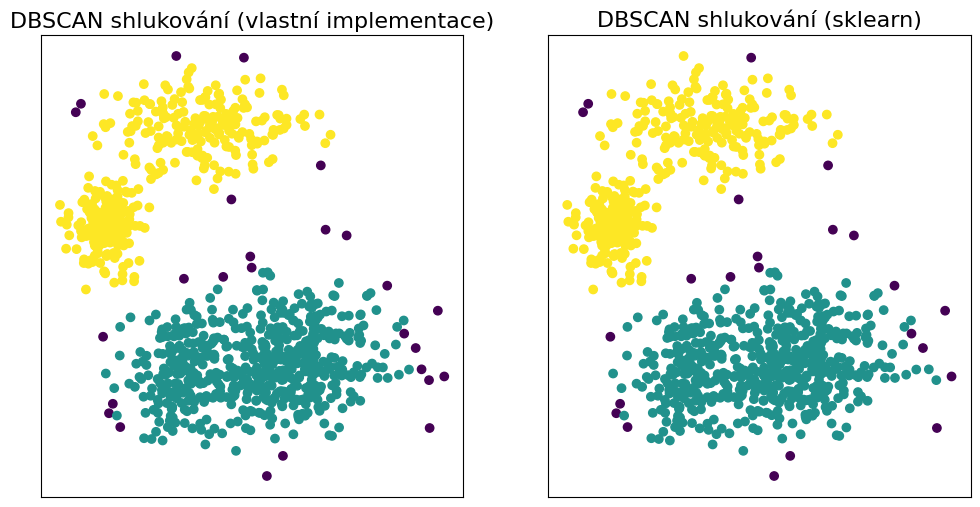

epsilon: 3.1, min_pts: 11

Celkový čas: 0.5664 sekund
Celkový čas: 0.0101 sekund


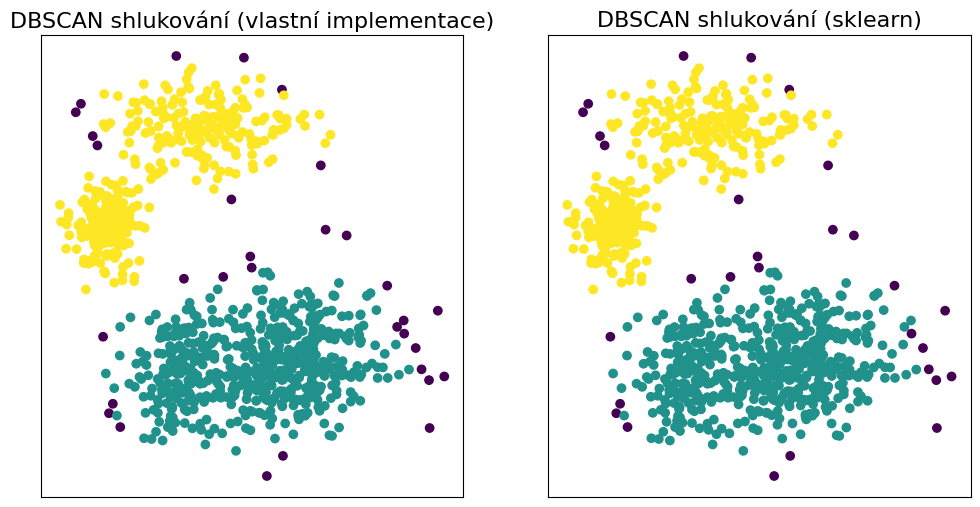

In [25]:
for epsilon in epsilon_range:
    for min_pts in min_pts_range:
        print(f"epsilon: {epsilon}, min_pts: {min_pts}\n")
        data = np.loadtxt(chosen_datasets, delimiter=';')
        my_dbscan = DBSCAN(input_epsilon=epsilon, input_min_points=min_pts)
        with TimeTracker():
            my_dbscan.run(data)
        dbscan_sklearn = DBSCAN_sklearn(eps=epsilon, min_samples=min_pts)
        with TimeTracker():
            dbscan_sklearn.fit(data)
        compare_plots(data, my_dbscan.get_labels(), dbscan_sklearn.labels_)

Tady to taky vypadá dobře. Výsledky se mění podle zvolených parametrů podle očekávání. Drobné změny si lze povšimnout u menších hodnot `epsilon` a `MinPts`, kde se vytváří méně menších shluků, ale u větších hodnot se vše stabilizuje.

### Dataset `densegrid`

Jelikož tento hodně hustý dataset, musíme nastavit epsilon mnohem menší než u předchozího datasetu.
Zvolíme hodnoty:
- epsilon od 0.1 do 0.5 s krokem 0.1
- minimální počet bodů MinPts od 5 do 11 s krokem 2.

In [26]:
chosen_datasets = all_cvs_paths[5]

In [27]:
epsilon_range = np.arange(0.1, 0.6, 0.1)
min_pts_range = np.arange(5, 12, 2)

epsilon: 0.1, min_pts: 5

Celkový čas: 9.3849 sekund
Celkový čas: 0.0199 sekund


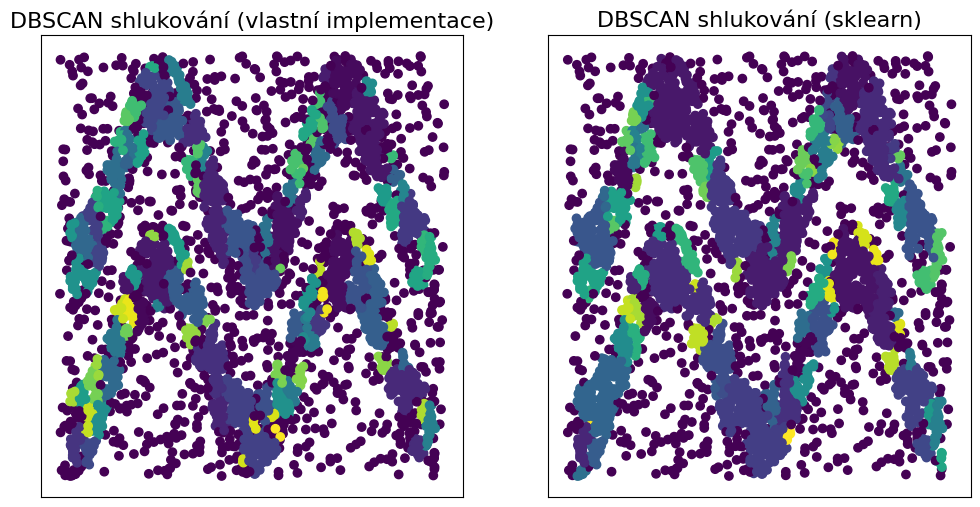

epsilon: 0.1, min_pts: 7

Celkový čas: 9.7797 sekund
Celkový čas: 0.0201 sekund


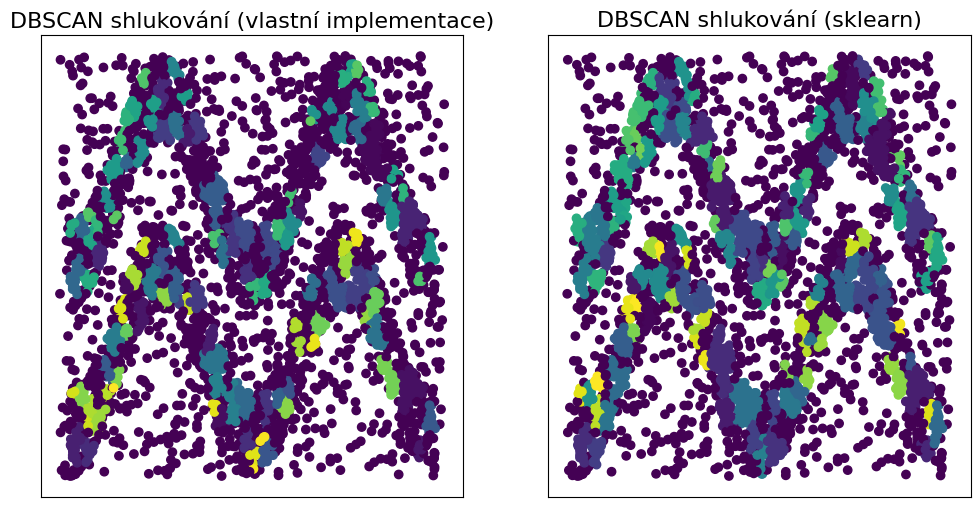

epsilon: 0.1, min_pts: 9

Celkový čas: 9.0199 sekund
Celkový čas: 0.0199 sekund


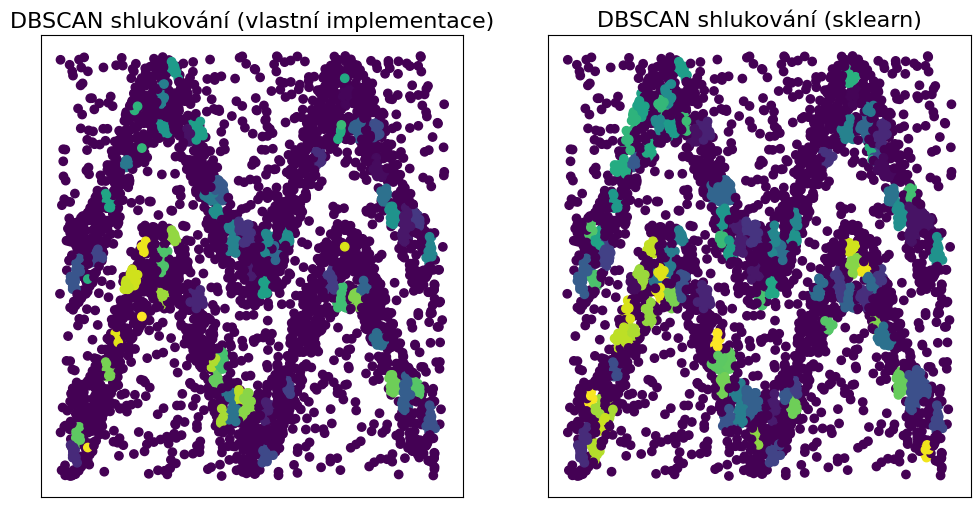

epsilon: 0.1, min_pts: 11

Celkový čas: 9.9347 sekund
Celkový čas: 0.0154 sekund


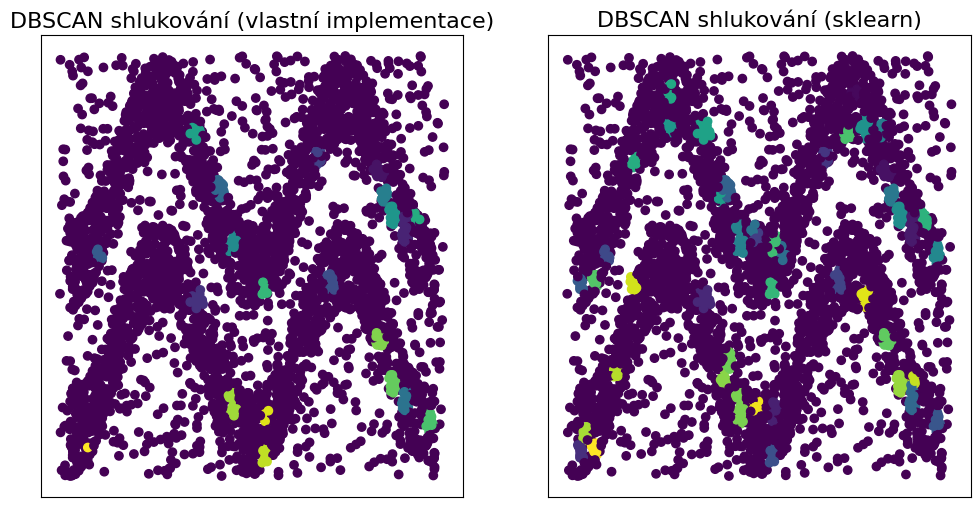

epsilon: 0.2, min_pts: 5

Celkový čas: 10.2846 sekund
Celkový čas: 0.0197 sekund


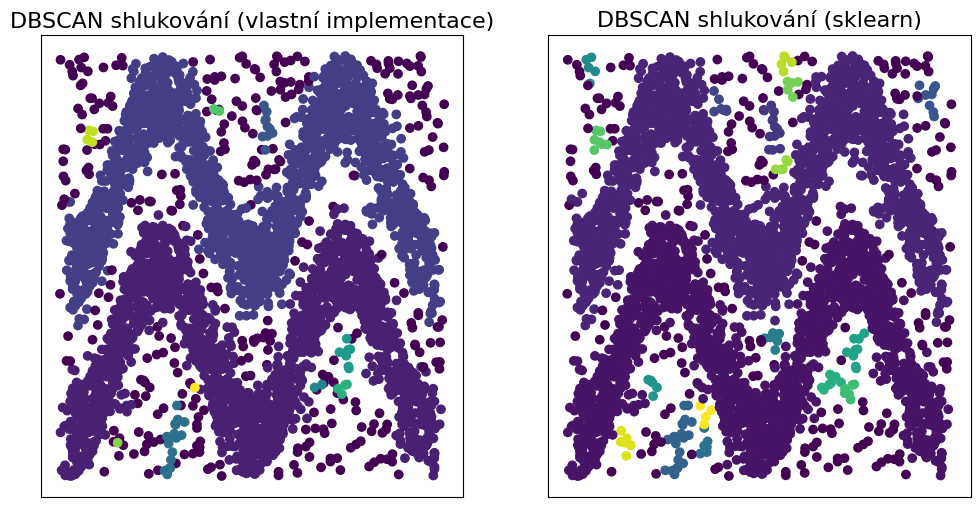

epsilon: 0.2, min_pts: 7

Celkový čas: 9.4101 sekund
Celkový čas: 0.0200 sekund


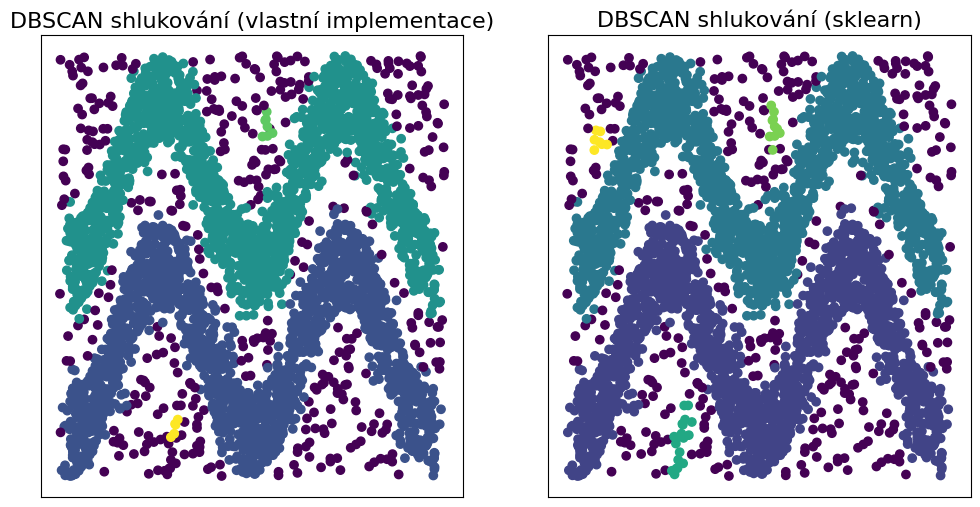

epsilon: 0.2, min_pts: 9

Celkový čas: 9.4599 sekund
Celkový čas: 0.0251 sekund


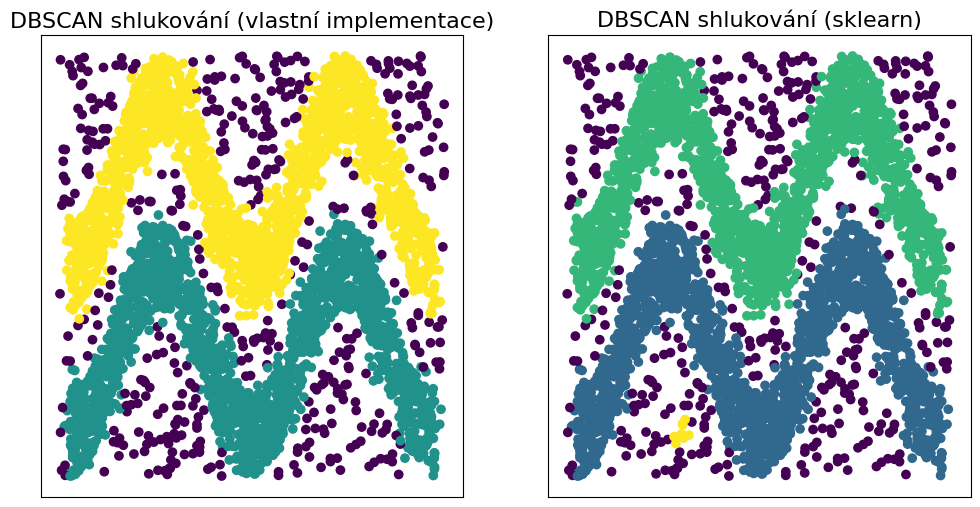

epsilon: 0.2, min_pts: 11

Celkový čas: 10.3301 sekund
Celkový čas: 0.0208 sekund


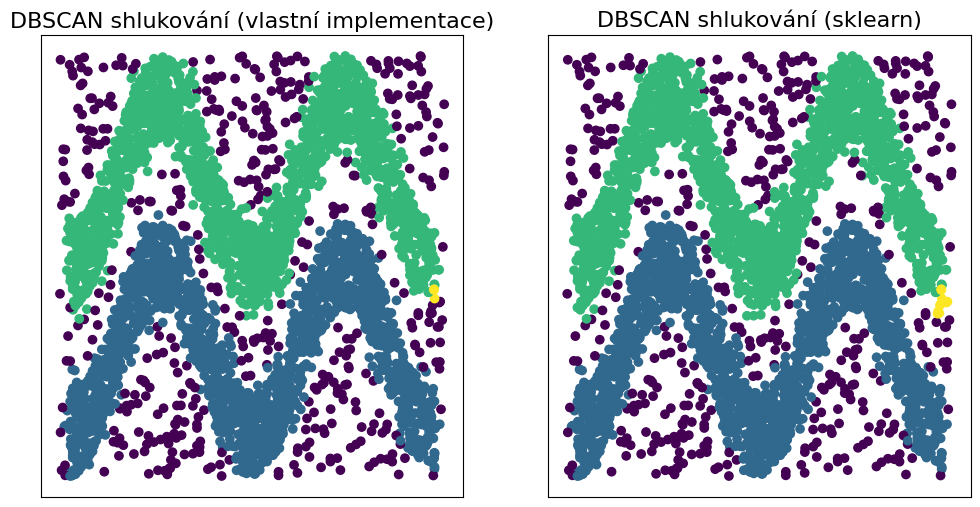

epsilon: 0.30000000000000004, min_pts: 5

Celkový čas: 9.7914 sekund
Celkový čas: 0.0270 sekund


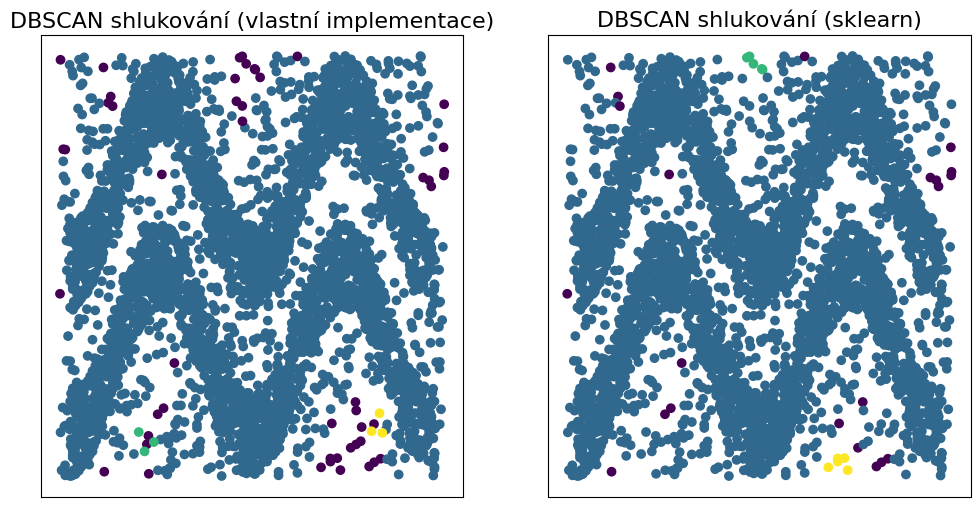

epsilon: 0.30000000000000004, min_pts: 7

Celkový čas: 10.3410 sekund
Celkový čas: 0.0280 sekund


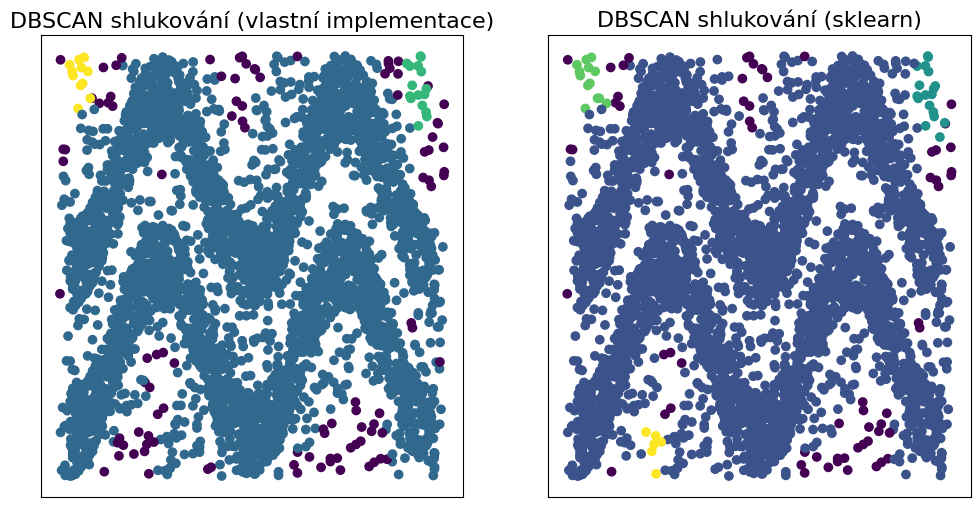

epsilon: 0.30000000000000004, min_pts: 9

Celkový čas: 9.1486 sekund
Celkový čas: 0.0280 sekund


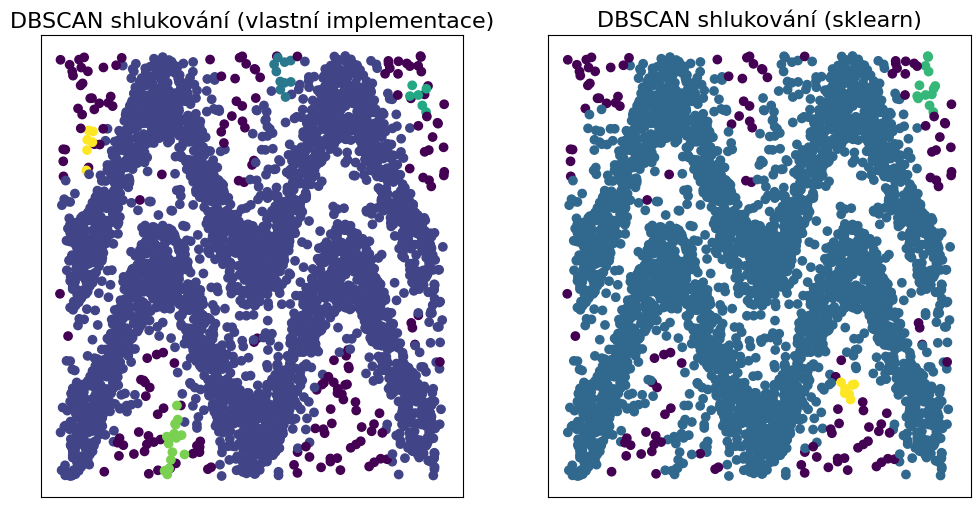

epsilon: 0.30000000000000004, min_pts: 11

Celkový čas: 9.0617 sekund
Celkový čas: 0.0250 sekund


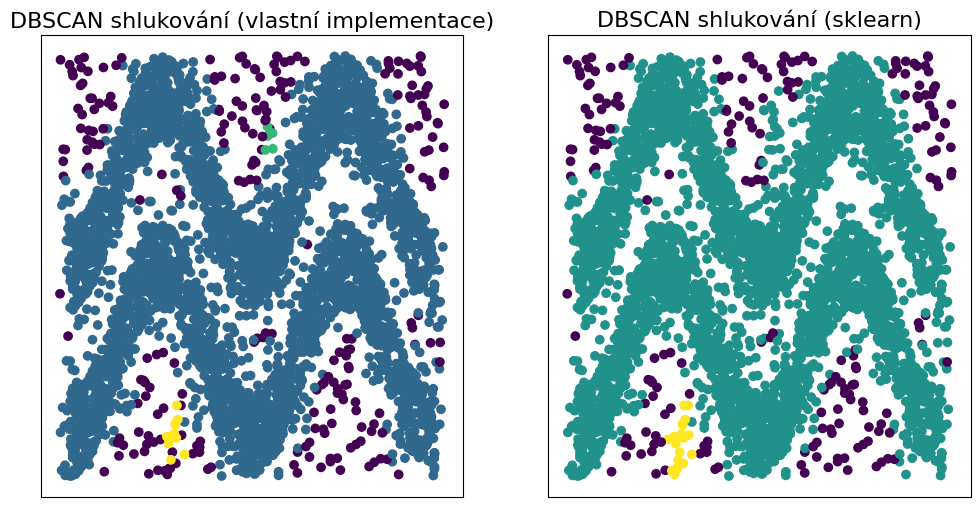

epsilon: 0.4, min_pts: 5

Celkový čas: 9.1717 sekund
Celkový čas: 0.0258 sekund


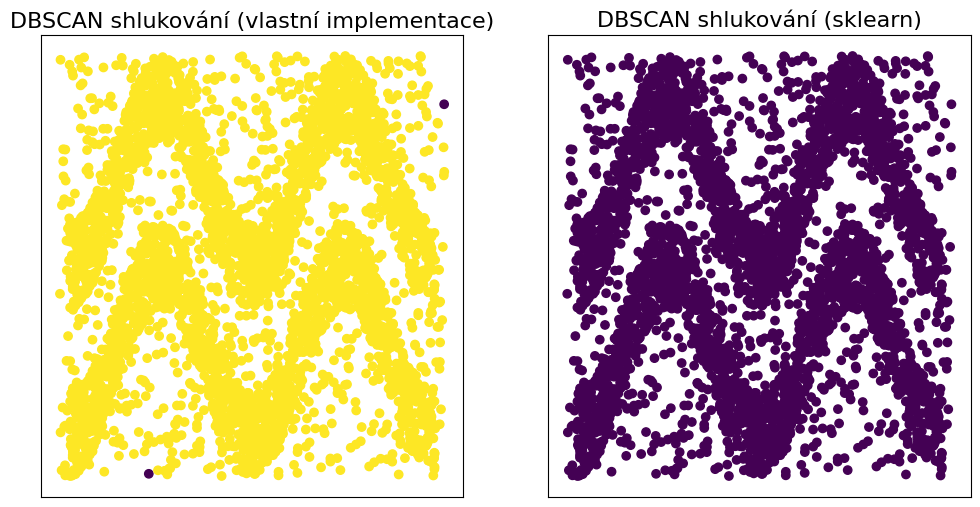

epsilon: 0.4, min_pts: 7

Celkový čas: 9.5101 sekund
Celkový čas: 0.0304 sekund


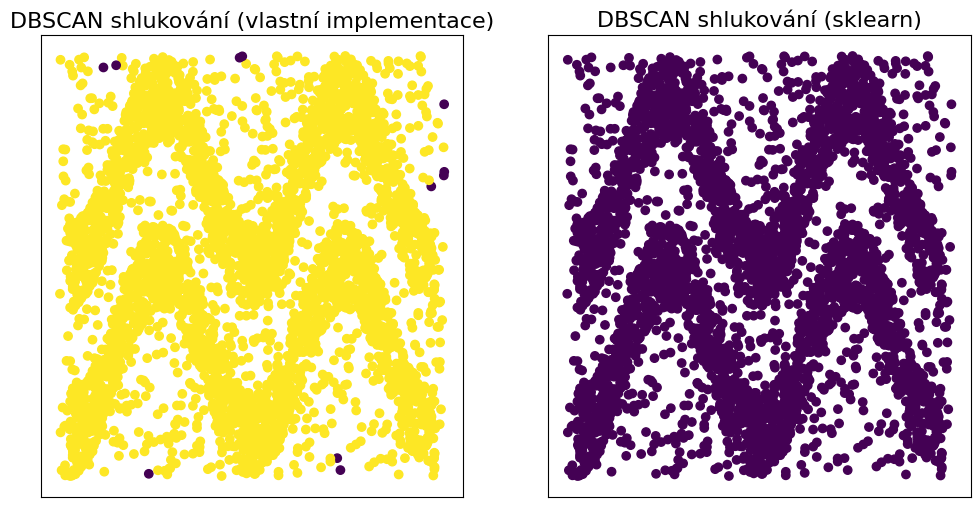

epsilon: 0.4, min_pts: 9

Celkový čas: 9.5765 sekund
Celkový čas: 0.0401 sekund


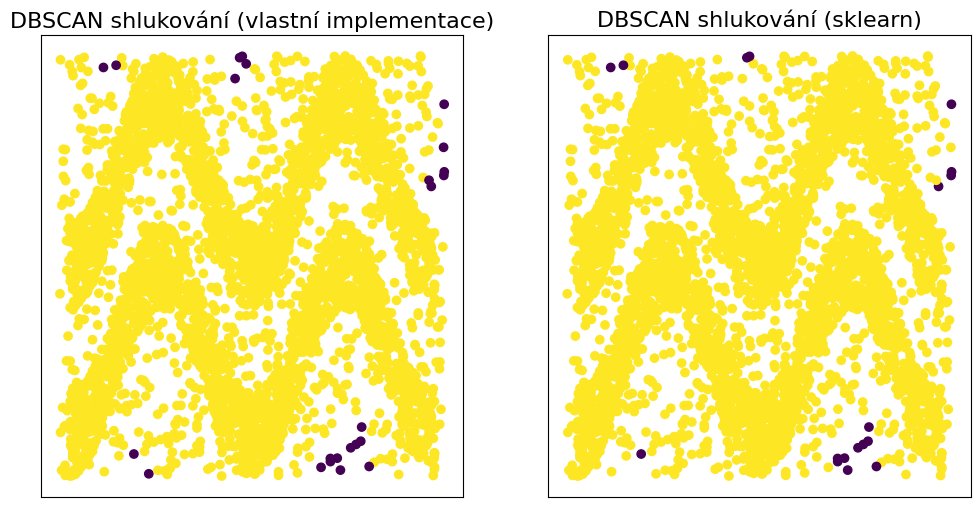

epsilon: 0.4, min_pts: 11

Celkový čas: 9.6201 sekund
Celkový čas: 0.0398 sekund


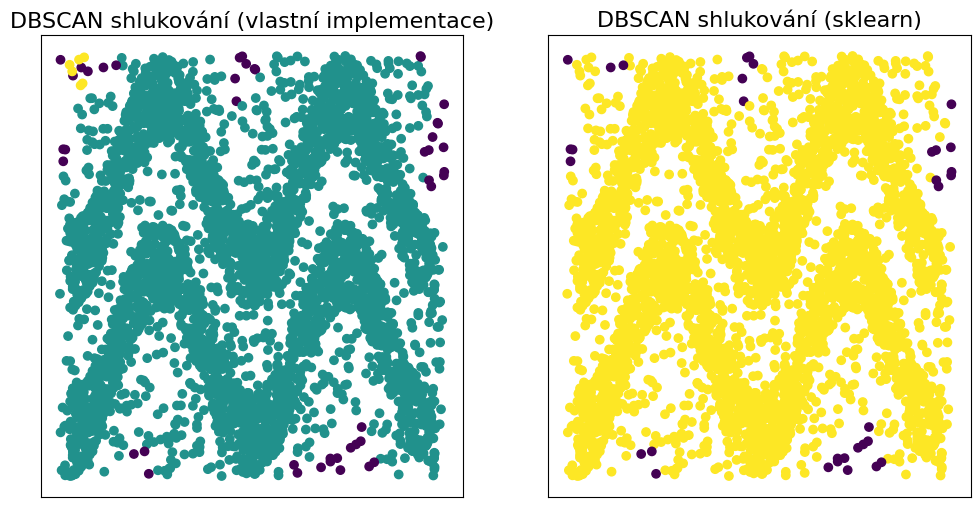

epsilon: 0.5, min_pts: 5

Celkový čas: 9.9350 sekund
Celkový čas: 0.0400 sekund


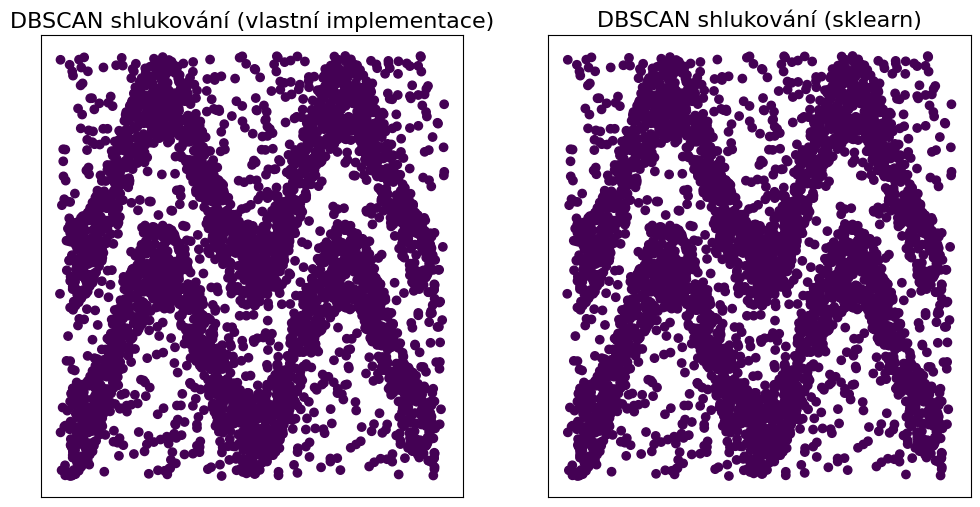

epsilon: 0.5, min_pts: 7

Celkový čas: 9.2813 sekund
Celkový čas: 0.0344 sekund


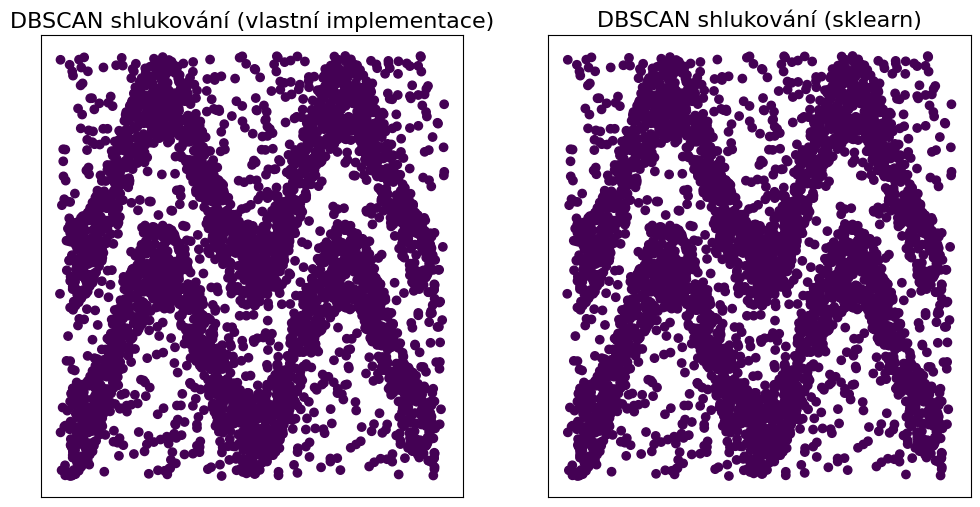

epsilon: 0.5, min_pts: 9

Celkový čas: 9.2299 sekund
Celkový čas: 0.0298 sekund


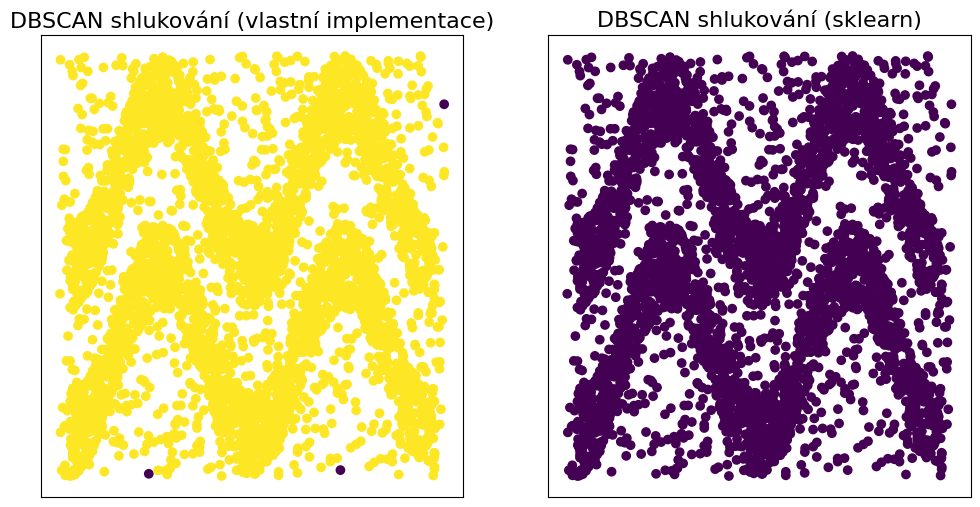

epsilon: 0.5, min_pts: 11

Celkový čas: 9.7500 sekund
Celkový čas: 0.0400 sekund


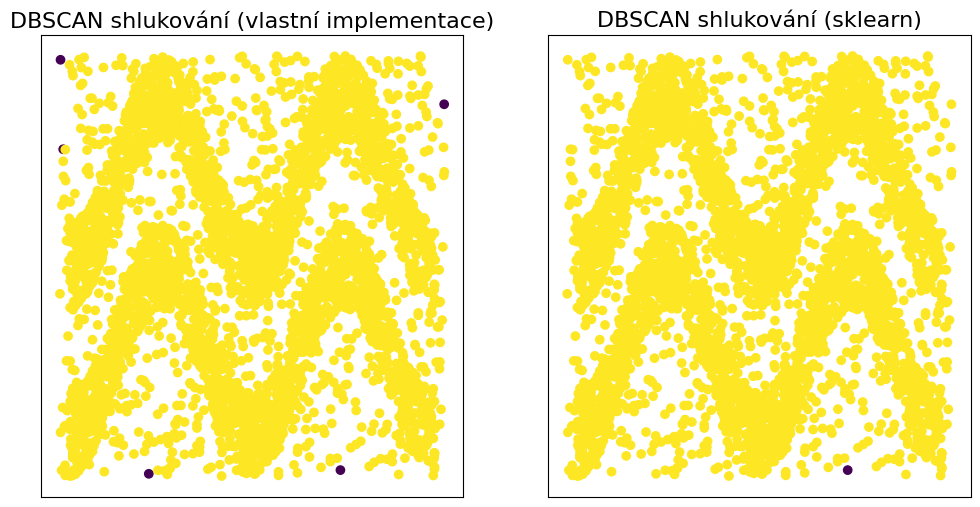

In [28]:
for epsilon in epsilon_range:
    for min_pts in min_pts_range:
        print(f"epsilon: {epsilon}, min_pts: {min_pts}\n")
        data = np.loadtxt(chosen_datasets, delimiter=';')
        my_dbscan = DBSCAN(input_epsilon=epsilon, input_min_points=min_pts)
        with TimeTracker():
            my_dbscan.run(data)
        dbscan_sklearn = DBSCAN_sklearn(eps=epsilon, min_samples=min_pts)
        with TimeTracker():
            dbscan_sklearn.fit(data)
        compare_plots(data, my_dbscan.get_labels(), dbscan_sklearn.labels_)

Stejný výsledek jako u předchozího datasetu. Výsledky se mění podle zvolených parametrů podle očekávání. Drobné změny si lze povšimnout u menších hodnot `epsilon` a `MinPts`, kde se vytváří méně menších shluků, ale u větších hodnot se vše stabilizuje.